In [1]:
import datetime

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pymc3 as pm
from scipy.stats import gaussian_kde

WARNING (theano.link.c.cmodule): install mkl with `conda install mkl-service`: No module named 'mkl'


In [2]:
import warnings
warnings.filterwarnings('ignore')

plt.rcParams.update({'font.size': 22})
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.options.mode.chained_assignment = None

In [3]:
# commission cutoffs for each market. 
# These cutoffs were determined by looking at the plots in buyside_commission_plots.ipynb
market_area_to_commission_cutoffs = {
    'Atlanta': [3, 2.5, 2],
    'Austin': [3, 2.5, 2],
    'Boston': [2.0, 2],
    'Buffalo': [3, 2.5, 2],
    'Camden': [2.5, 2],
    'Chicago': [2.5, 2],
    'Cleveland': [2.5, 2],
    'Columbus': [3, 2.5, 2],
    'DC metro area': [2.5, 2.0],
    'Dallas': [3, 2.5, 2],
    'Denver': [2.8, 2.5, 2],
    'Fort Lauderdale': [2.5, 2],
    'Hartford': [2.5, 2],
    'Houston': [3, 2.5, 2],
    'Indianapolis': [3, 2.5, 2],
    'Jersey Shore': [2.0, 2],
    'Kansas City': [3, 2.5, 2],
    'Los Angeles': [2.5, 2],
    'Nashville': [3, 2.5, 2],
    'Orange County': [2.0, 2],
    'Orlando': [2.5, 2],
    'Philadelphia': [2.5, 2],
    'Phoenix': [2.5, 2],
    'Pittsburgh': [2.5, 2],
    'Portland, OR': [2.5, 2.25, 2],
    'Providence': [2.0, 2],
    'Research-Triangle': [2.4, 2.2, 2],
    'Riverside': [2.0, 2],
    'San Antonio': [3.0, 2.5, 2],
    'San Diego': [2.5, 2],
    'Seattle': [2.5, 2],
    'St. Louis': [2.5, 2],
    'Virginia Beach': [3, 2.5, 2],
    'West Palm Beach': [2.5, 2]
}

In [4]:
market_areas_to_consider = set(market_area_to_commission_cutoffs)

# see paper for an explanation of why Nashville was excluded from the analysis
market_areas_to_consider -= {'Nashville'}

## Bayesian hierarchical logistic regression model

In [5]:
df = pd.read_csv('sale_outcome_info.csv')

In [6]:
df.head()

,external_id,created_date,address,city,state,zipcode,market_area,null_redfin_price_estimate,buyside_commission_range,created_month_index,price_range,year_built_range,price_difference_pct_range,avg_views_5,avg_views_10,avg_views_30,avg_views_100,avg_views_200,redfin_price_estimate,opendoor,zillow,offerpad,hoa,beds_range,baths_range,sqft_range,property_category_index,brokerage_index,brokerage_listings_pct_range,beds,baths,sqft,property_type,list_date,pending_date,sale_date,list_to_pending_days,dom,sale_price,days_until_sale,home_sold
0,13663942,2022-01-14,10 Terrace Ln,Des Plaines,IL,60019,Chicago,1,0,7,6,4,1,1888.153755,1684.743534,1518.060252,1231.980749,1049.688773,NaN,0,0,0,0,3,2,1,0,0,8,4.0,2,"1,273",Single Family Residential,2022-01-13,2022-01-16,2022-02-28,4,4,385000,46,1.0
1,23331416,2021-07-27,208 Meadowbrook Dr,Bolingbrook,IL,60440,Chicago,1,0,1,3,4,1,1243.320956,1097.936268,1113.508900,1262.284556,1204.498678,NaN,0,0,0,0,2,2,3,0,0,8,3.0,2,"1,811",Single Family Residential,2021-07-15,2021-07-18,2021-09-09,4,4,275000,56,1.0
2,13847488,2021-08-03,303 E Ivy Ln,Arlington Heights,IL,60004,Chicago,1,0,2,6,4,1,860.582481,943.937557,938.306499,1243.650506,1115.046550,NaN,0,0,0,0,2,2,1,0,0,8,3.0,2,"1,540",Single Family Residential,2021-07-23,2021-10-22,2021-12-03,92,92,365000,133,0.0
3,21765334,2021-11-10,202 Hemlock Ave,Romeoville,IL,60446,Chicago,1,0,5,2,4,1,896.332022,1171.125672,986.257433,896.232247,992.979730,NaN,0,0,0,0,3,2,0,0,0,8,4.0,2,"1,170",Single Family Residential,2021-11-03,2021-11-09,2021-12-06,7,7,225000,33,1.0
4,13894291,2021-07-20,458 E Carpenter Dr,Palatine,IL,60074,Chicago,1,0,1,7,4,1,923.631107,1012.231276,915.941123,927.873459,803.631951,NaN,0,0,0,0,3,3,4,0,0,8,4.0,3.5,"2,468",Single Family Residential,2021-07-09,2021-07-12,2021-08-26,4,4,470000,48,1.0


In [7]:
df['home_sold'].value_counts(dropna=False) / len(df)

1.0    0.701338
0.0    0.229308
NaN    0.069354
Name: home_sold, dtype: float64

In [8]:
final_df = df[df['home_sold'].notna()]
print(len(final_df) / len(df))

0.9306463297785326


In [9]:
final_df['home_sold'].mean()

0.7536034754076405

In [10]:
final_df['buyside_commission_range'].value_counts() / len(final_df)

0    0.838693
2    0.098960
1    0.051633
3    0.010714
Name: buyside_commission_range, dtype: float64

In [11]:
# see paper for an explanation of why Virginia Beach excluded from the analysis
final_df_f = final_df[final_df['market_area'] != 'Virginia Beach']

In [12]:
sorted_market_areas = np.sort(final_df_f['market_area'].unique())

## Bayesian model

In [13]:
market_area_to_index_df = pd.DataFrame.from_dict({'market_area': sorted_market_areas})
market_area_to_index_df['market_area_index'] = market_area_to_index_df.index

market_area_num = len(market_area_to_index_df)

In [14]:
market_area_num

32

In [15]:
final_df_f = final_df_f.merge(market_area_to_index_df, on='market_area', how='inner')

In [16]:
home_sale_values = final_df_f['home_sold'].to_numpy()
market_area_indices = final_df_f['market_area_index'].to_numpy()

In [17]:
commission_vals = final_df_f['buyside_commission_range'].nunique()
brokerage_listing_vals = final_df_f['brokerage_listings_pct_range'].nunique()
created_month_vals = final_df_f['created_month_index'].nunique()
top_brokerage_vals = final_df_f['brokerage_index'].nunique()
property_category_vals = final_df_f['property_category_index'].nunique()

In [18]:
feature_to_n_bins = {
    'beds': 4,
    'baths': 4,
    'sqft': 5,
    'price': 10,
    'year_built': 10,
    'price_difference_pct': 10
}

In [19]:
final_df_f.head()

,external_id,created_date,address,city,state,zipcode,market_area,null_redfin_price_estimate,buyside_commission_range,created_month_index,price_range,year_built_range,price_difference_pct_range,avg_views_5,avg_views_10,avg_views_30,avg_views_100,avg_views_200,redfin_price_estimate,opendoor,zillow,offerpad,hoa,beds_range,baths_range,sqft_range,property_category_index,brokerage_index,brokerage_listings_pct_range,beds,baths,sqft,property_type,list_date,pending_date,sale_date,list_to_pending_days,dom,sale_price,days_until_sale,home_sold,market_area_index
0,13663942,2022-01-14,10 Terrace Ln,Des Plaines,IL,60019,Chicago,1,0,7,6,4,1,1888.153755,1684.743534,1518.060252,1231.980749,1049.688773,NaN,0,0,0,0,3,2,1,0,0,8,4.0,2,"1,273",Single Family Residential,2022-01-13,2022-01-16,2022-02-28,4,4,385000,46,1.0,5
1,23331416,2021-07-27,208 Meadowbrook Dr,Bolingbrook,IL,60440,Chicago,1,0,1,3,4,1,1243.320956,1097.936268,1113.508900,1262.284556,1204.498678,NaN,0,0,0,0,2,2,3,0,0,8,3.0,2,"1,811",Single Family Residential,2021-07-15,2021-07-18,2021-09-09,4,4,275000,56,1.0,5
2,13847488,2021-08-03,303 E Ivy Ln,Arlington Heights,IL,60004,Chicago,1,0,2,6,4,1,860.582481,943.937557,938.306499,1243.650506,1115.046550,NaN,0,0,0,0,2,2,1,0,0,8,3.0,2,"1,540",Single Family Residential,2021-07-23,2021-10-22,2021-12-03,92,92,365000,133,0.0,5
3,21765334,2021-11-10,202 Hemlock Ave,Romeoville,IL,60446,Chicago,1,0,5,2,4,1,896.332022,1171.125672,986.257433,896.232247,992.979730,NaN,0,0,0,0,3,2,0,0,0,8,4.0,2,"1,170",Single Family Residential,2021-11-03,2021-11-09,2021-12-06,7,7,225000,33,1.0,5
4,13894291,2021-07-20,458 E Carpenter Dr,Palatine,IL,60074,Chicago,1,0,1,7,4,1,923.631107,1012.231276,915.941123,927.873459,803.631951,NaN,0,0,0,0,3,3,4,0,0,8,4.0,3.5,"2,468",Single Family Residential,2021-07-09,2021-07-12,2021-08-26,4,4,470000,48,1.0,5


In [20]:
for col in final_df_f.columns:
    if col.startswith('avg_views'):
        final_df_f[col] /= 1000

In [21]:
sigma_prior = 1000

np.random.seed(5555)
with pm.Model() as model:
    mu_comm = pm.Normal('mu_comm', mu=0, sigma=100, shape=commission_vals)
    sigma_comm = pm.Exponential('sigma_comm', lam=0.001, shape=commission_vals)
    comm_offset = pm.Normal('comm_offset', mu=0, sigma=1, shape=(market_area_num, commission_vals))
    b_comm = pm.Deterministic('b_comm', mu_comm + comm_offset * sigma_comm)
    
    sigma_b = pm.Exponential('sigma_b', lam=0.001, shape=16)

    b_intercept = pm.Normal('b_intercept', mu=0, sigma=sigma_b[0], shape=market_area_num)
    b_hoa = pm.Normal('b_hoa', mu=0, sigma=sigma_b[1], shape=market_area_num)
    
    b_opendoor = pm.Normal('b_opendoor', mu=0, sigma=sigma_b[2], shape=market_area_num)
    b_zillow = pm.Normal('b_zillow', mu=0, sigma=sigma_b[3], shape=market_area_num)
    b_offerpad = pm.Normal('b_offerpad', mu=0, sigma=sigma_b[4], shape=market_area_num)
    
    b_avg_views_5 = pm.Normal('b_avg_views_5', mu=0, sigma=sigma_prior, shape=market_area_num)
    b_avg_views_10 = pm.Normal('b_avg_views_10', mu=0, sigma=sigma_prior, shape=market_area_num)
    b_avg_views_30 = pm.Normal('b_avg_views_30', mu=0, sigma=sigma_prior, shape=market_area_num)
    b_avg_views_100 = pm.Normal('b_avg_views_100', mu=0, sigma=sigma_prior, shape=market_area_num)
    b_avg_views_200 = pm.Normal('b_avg_views_200', mu=0, sigma=sigma_prior, shape=market_area_num)
    
    b_null_price = pm.Normal('b_null_price', mu=0, sigma=sigma_b[5], shape=market_area_num)
    b_price = pm.Normal('b_price', mu=0, sigma=sigma_b[6], shape=(market_area_num, feature_to_n_bins['price']))
    b_beds = pm.Normal('b_beds', mu=0, sigma=sigma_b[7], shape=(market_area_num, feature_to_n_bins['beds']))
    b_baths = pm.Normal('b_baths', mu=0, sigma=sigma_b[8], shape=(market_area_num, feature_to_n_bins['baths']))
    b_sqft = pm.Normal('b_sqft', mu=0, sigma=sigma_b[9], shape=(market_area_num, feature_to_n_bins['sqft']))
    b_year_built = pm.Normal('b_year_built', mu=0, sigma=sigma_b[10], 
                             shape=(market_area_num, feature_to_n_bins['year_built']))
    b_price_difference_pct = pm.Normal('b_price_difference_pct', mu=0, sigma=sigma_b[11], 
                                       shape=(market_area_num, feature_to_n_bins['price_difference_pct']))
    b_property_category = pm.Normal('b_property_category', mu=0, sigma=sigma_b[12], 
                                    shape=(market_area_num, property_category_vals))
    b_brokerage = pm.Normal('b_brokerage', mu=0, sigma=sigma_b[13], shape=(market_area_num, top_brokerage_vals))
    b_brokerage_listings_pct = pm.Normal('b_brokerage_listings_pct', mu=0, sigma=sigma_b[14], 
                                         shape=(market_area_num, brokerage_listing_vals))
    b_created_month = pm.Normal('b_created_month', mu=0, sigma=sigma_b[15], 
                                shape=(market_area_num, created_month_vals))

    lin_pred_func = pm.Deterministic(
        'lin_pred_func', 
        b_intercept[market_area_indices] +
        b_comm[market_area_indices, final_df_f['buyside_commission_range'].values] +
        b_hoa[market_area_indices] * final_df_f['hoa'] + 
        b_opendoor[market_area_indices] * final_df_f['opendoor'] +
        b_zillow[market_area_indices] * final_df_f['zillow'] +
        b_offerpad[market_area_indices] * final_df_f['offerpad'] +
        b_avg_views_5[market_area_indices] * final_df_f['avg_views_5'] + 
        b_avg_views_10[market_area_indices] * final_df_f['avg_views_10'] + 
        b_avg_views_30[market_area_indices] * final_df_f['avg_views_30'] +
        b_avg_views_100[market_area_indices] * final_df_f['avg_views_100'] +
        b_avg_views_200[market_area_indices] * final_df_f['avg_views_200'] +
        b_null_price[market_area_indices] * final_df_f['null_redfin_price_estimate'] + 
        b_price[market_area_indices, final_df_f['price_range'].values] + 
        b_beds[market_area_indices, final_df_f['beds_range'].values] + 
        b_baths[market_area_indices, final_df_f['baths_range'].values] + 
        b_sqft[market_area_indices, final_df_f['sqft_range'].values] + 
        b_year_built[market_area_indices, final_df_f['year_built_range'].values] + 
        b_price_difference_pct[market_area_indices, final_df_f['price_difference_pct_range'].values] +  
        b_property_category[market_area_indices, final_df_f['property_category_index'].values] +
        b_brokerage[market_area_indices, final_df_f['brokerage_index'].values] + 
        b_brokerage_listings_pct[market_area_indices, final_df_f['brokerage_listings_pct_range'].values] +
        b_created_month[market_area_indices, final_df_f['created_month_index'].values]
    ) 

    p = pm.math.invlogit(lin_pred_func)
    
    home_sold = pm.Bernoulli('home_sold', p=p, observed=home_sale_values)

In [22]:
rerun_sampler = False

In [23]:
# load trace (note: refitting the model will take around 36 hours)
with model:
    if rerun_sampler:
        trace = pm.sample(500, tune=1000, chains=4, target_accept=0.9, init='advi+adapt_diag', n_init=50_000)
    else:
        trace = pm.load_trace('prob_of_sale_90_days_trace')

In [24]:
var_names = [
    'b_price_difference_pct', 'b_year_built', 'b_price', 'b_avg_views_5', 'b_avg_views_10', 'b_avg_views_30', 
    'b_avg_views_100', 'b_avg_views_200', 'b_created_month', 'sigma_b', 'b_null_price', 'b_hoa', 
    'b_intercept', 'b_opendoor', 'b_zillow', 'b_offerpad', 'b_beds', 'b_baths', 'b_sqft', 'b_property_category',
    'b_comm', 'sigma_comm', 'mu_comm'
]

with model:
    summary_df = pm.summary(trace, var_names=var_names).round(4)

In [25]:
summary_df.shape

(2328, 9)

In [26]:
# confirm that MCMC sampler has converged (the vast majority of r_hat values should be very close to 1)
summary_df['r_hat'].value_counts()

1.00    1946
1.01     346
1.02      31
1.03       4
1.05       1
Name: r_hat, dtype: int64

In [27]:
mu_comm_samples = trace['mu_comm']
going_rate_samples = mu_comm_samples[:, 0]

In [28]:
i_to_title = {
    1: 'Commission rate category $\mathregular{c_2}$',
    2: 'Commission rate category $\mathregular{c_3}$',
    3: 'Commission rate category $\mathregular{c_4}$'
}

In [29]:
def plot_distributions(mu_comm_samples, going_rate_samples, alpha=0.1):
    for i in range(3):
        plt.figure(figsize=(20, 10))
        sample_diffs = np.exp(mu_comm_samples[:, i + 1] - going_rate_samples)
        print(np.quantile(sample_diffs, [alpha / 2, 1 - (alpha / 2)]))
        print(np.mean(sample_diffs > 1))
        plt.hist(sample_diffs, bins=20)
        plt.xlabel('coefficient value')
        plt.ylabel('number of samples')
        plt.axvline(x=sample_diffs.mean(), color='r', linestyle='--', 
                    label=f'mean value: {round(sample_diffs.mean(), 3)}')
        plt.title(i_to_title[i + 1])
        plt.legend()
        plt.show()

[0.6828889  0.80087077]
0.0


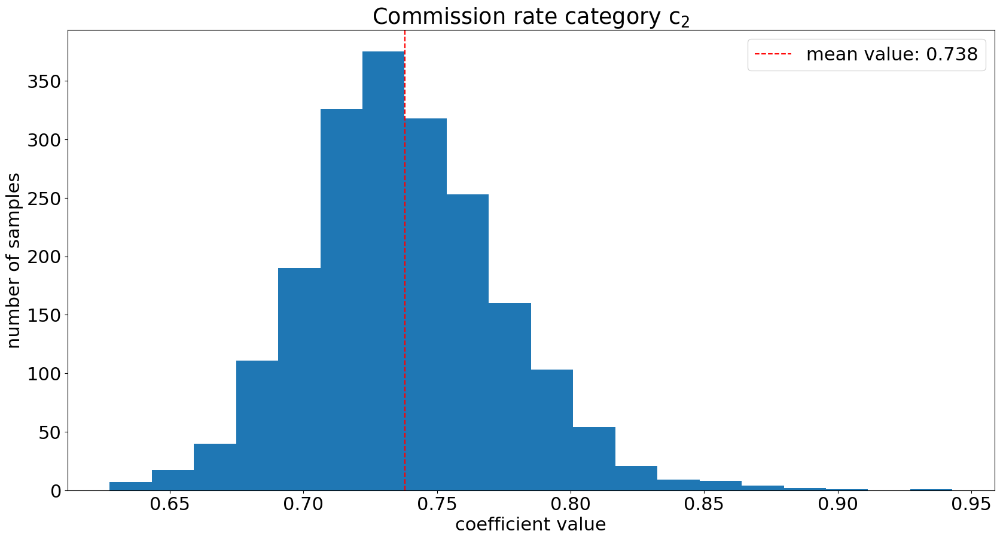

[0.61629741 0.74437787]
0.0


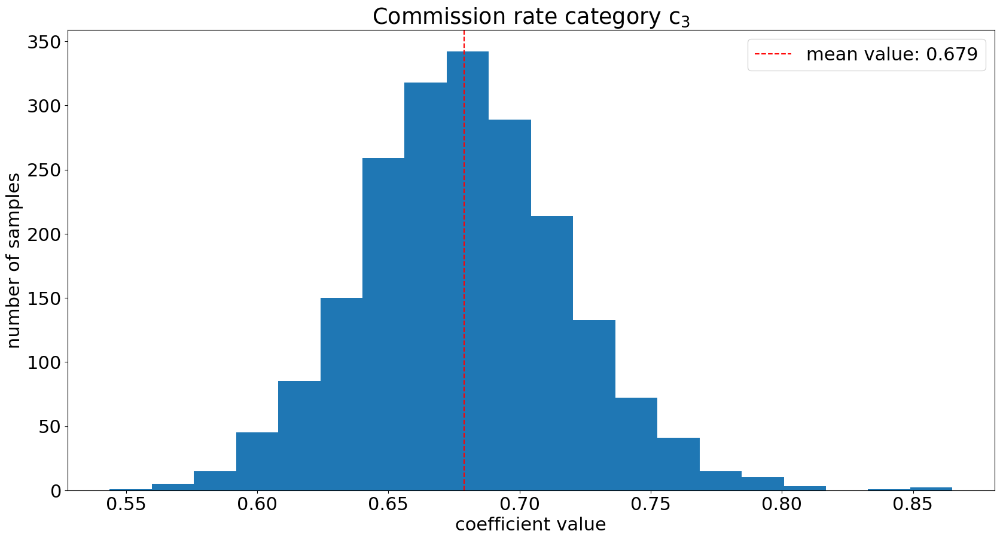

[0.42218823 0.54822193]
0.0


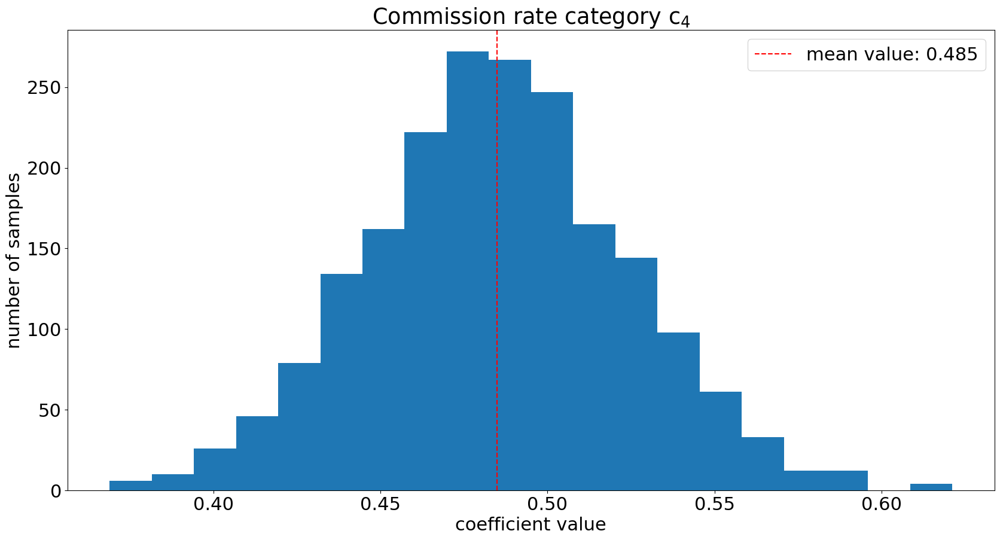

In [30]:
plot_distributions(mu_comm_samples, going_rate_samples)

In [31]:
diff_alpha = 0.05
sample_diffs_21 = (np.exp(mu_comm_samples[:, 2] - going_rate_samples) - 
                   np.exp(mu_comm_samples[:, 1] - going_rate_samples))
print(sample_diffs_21.mean())
print(np.quantile(sample_diffs_21, [diff_alpha / 2, 1 - (diff_alpha / 2)]))
print((sample_diffs_21 < 0).mean())

-0.058999201596414565
[-0.16189507  0.04158553]
0.8685


In [32]:
sample_diffs_31 = (np.exp(mu_comm_samples[:, 3] - going_rate_samples) - 
                   np.exp(mu_comm_samples[:, 1] - going_rate_samples))
print(sample_diffs_31.mean())
print(np.quantile(sample_diffs_31, [diff_alpha / 2, 1 - (diff_alpha / 2)]))
print((sample_diffs_31 < 0).mean())

-0.2529163854950624
[-0.36110487 -0.15270922]
1.0


In [33]:
sample_diffs_32 = (np.exp(mu_comm_samples[:, 3] - going_rate_samples) - 
                   np.exp(mu_comm_samples[:, 2] - going_rate_samples))
print(sample_diffs_32.mean())
print(np.quantile(sample_diffs_32, [diff_alpha / 2, 1 - (diff_alpha / 2)]))
print((sample_diffs_32 < 0).mean())

-0.19391718389864784
[-0.30270768 -0.08799636]
1.0


In [34]:
b_comm_samples = trace['b_comm']

In [35]:
b_comm_samples.shape

(2000, 32, 4)

In [36]:
def calculate_summary_statistics(b_comm_samples, mu_comm_samples, market_area_to_index_df, alpha=0.1):
    national_going_rate_samples = mu_comm_samples[:, 0]
    overall_lst = []

    lst = ['national']
    for i in range(3):
        sample_diffs = np.exp(mu_comm_samples[:, i + 1] - national_going_rate_samples)
        mean_diff = np.mean(sample_diffs)
        quantiles = np.quantile(sample_diffs, [alpha / 2, 1 - (alpha / 2)])
        lst.extend([mean_diff] + list(quantiles) + [(sample_diffs >= 1).mean()])

    overall_lst.append(lst)

    for market_area_index in range(market_area_num):
        market_area = market_area_to_index_df[
            market_area_to_index_df['market_area_index'] == market_area_index]['market_area'].iloc[0]
        market_area_samples = b_comm_samples[:, market_area_index, :]
        going_rate_samples = market_area_samples[:, 0]
        lst = [market_area]
        for i in range(1, 4):
            samples = market_area_samples[:, i]
            sample_diffs = np.exp(samples - going_rate_samples)
            mean_diff = np.mean(sample_diffs)
            quantiles = np.quantile(sample_diffs, [alpha / 2, 1 - (alpha / 2)])
            lst.extend([mean_diff] + list(quantiles) + [(sample_diffs >= 1).mean()])
        overall_lst.append(lst)

    columns = ['market_area', 'mean1', 'lower1', 'upper1', 'pvalue1', 'mean2', 'lower2', 'upper2', 'pvalue2',
               'mean3', 'lower3', 'upper3', 'pvalue3']
    effect_df = pd.DataFrame(overall_lst, columns=columns)
    effect_df['is_national'] = effect_df['market_area'].apply(lambda x: int(x == 'national'))
    return effect_df

In [37]:
effect_df = calculate_summary_statistics(b_comm_samples, mu_comm_samples, market_area_to_index_df)

In [38]:
effect_df.head()

,market_area,mean1,lower1,upper1,pvalue1,mean2,lower2,upper2,pvalue2,mean3,lower3,upper3,pvalue3,is_national
0,national,0.737851,0.682889,0.800871,0.0000,0.678852,0.616297,0.744378,0.0000,0.484934,0.422188,0.548222,0.000,1
1,Atlanta,0.661106,0.601304,0.722333,0.0000,0.393832,0.339864,0.452300,0.0000,0.730526,0.481899,1.103504,0.093,0
2,Austin,0.672769,0.593310,0.755968,0.0000,0.602450,0.474676,0.749048,0.0005,0.447657,0.284295,0.646238,0.001,0
3,Boston,0.742315,0.614230,0.904071,0.0110,0.696428,0.464436,1.004032,0.0530,0.513234,0.379879,0.682169,0.000,0
4,Buffalo,0.754421,0.650008,0.877690,0.0025,0.695899,0.472666,0.972235,0.0350,0.482529,0.284231,0.725735,0.007,0


In [39]:
def plot_effects(effect_df):
    just_under_market_areas = [market_area for market_area, cutoffs in market_area_to_commission_cutoffs.items()
                               if len(cutoffs) == 3 and market_area in market_areas_to_consider]

    just_under_market_areas = ['national'] + just_under_market_areas

    above_2_market_areas = [market_area for market_area, cutoffs in market_area_to_commission_cutoffs.items()
                            if cutoffs[0] != 2]

    above_2_market_areas = ['national'] + above_2_market_areas

    for i in range(1, 4):
        if i == 1:
            df = effect_df[effect_df['market_area'].isin(just_under_market_areas)]
        elif i == 2:
            df = effect_df[effect_df['market_area'].isin(above_2_market_areas)]
        else:
            df = effect_df.copy()
        df.sort_values(['is_national', f'upper{i}'], ascending=[False, True], inplace=True)
        
        
        plt.figure(figsize=(20, max(10, len(df) / 2)))
        y = [x for x in range(len(df), 0, -1)]
        x = df[f'mean{i}']
        xerr = (np.abs(df[[f'lower{i}', f'upper{i}']].to_numpy() -
                       df[f'mean{i}'].to_numpy().reshape(-1, 1)).T)
        is_significant = df[f'upper{i}'] < 1
        colors = ['g' if x else 'r' for x in is_significant]
        plt.errorbar(x=x, y=y, xerr=xerr, color='b', ecolor=colors, capsize=0, marker='o', markersize=10, 
                     ls='none')
        plt.axvline(x=1, linestyle='--', color='k')
        
        yticks = []
        for market_area in df['market_area']:
            if market_area == 'national':
                num_listings = len(final_df_f[final_df_f['buyside_commission_range'] == i])
                p_value = df[df['market_area'] == 'national'][f'pvalue{i}'].iloc[0]
            else:
                num_listings = len(final_df_f[(final_df_f['buyside_commission_range'] == i) &
                                              (final_df_f['market_area'] == market_area)])
                p_value = df[df['market_area'] == market_area][f'pvalue{i}'].iloc[0]
            
            prob_below_one = 100 * (1 - p_value)
            yticks.append(f'{market_area} (N={num_listings}, p={round(prob_below_one)}%)')
        
        plt.yticks(y, yticks)
        plt.xlabel('odds of selling divided by odds of selling when offering going rate commission')
        xticks = plt.xticks()[0]
        for xtick in xticks[1: -1]:
            plt.axvline(x=xtick, color='k', linestyle='-', alpha=0.2)
        plt.title(i_to_title[i])
        
        yticks = plt.yticks()[0]
        for ytick in yticks:
            plt.axhline(y=ytick, color='k', linestyle='--', alpha=0.2)
        plt.show()

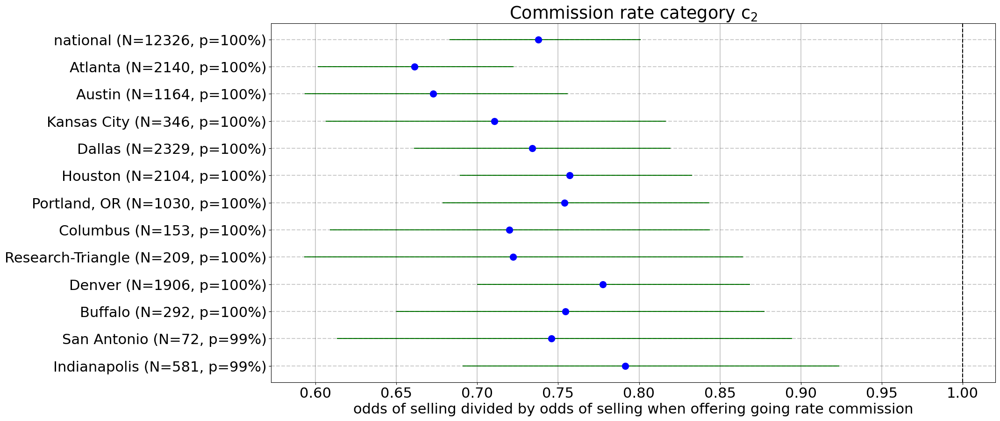

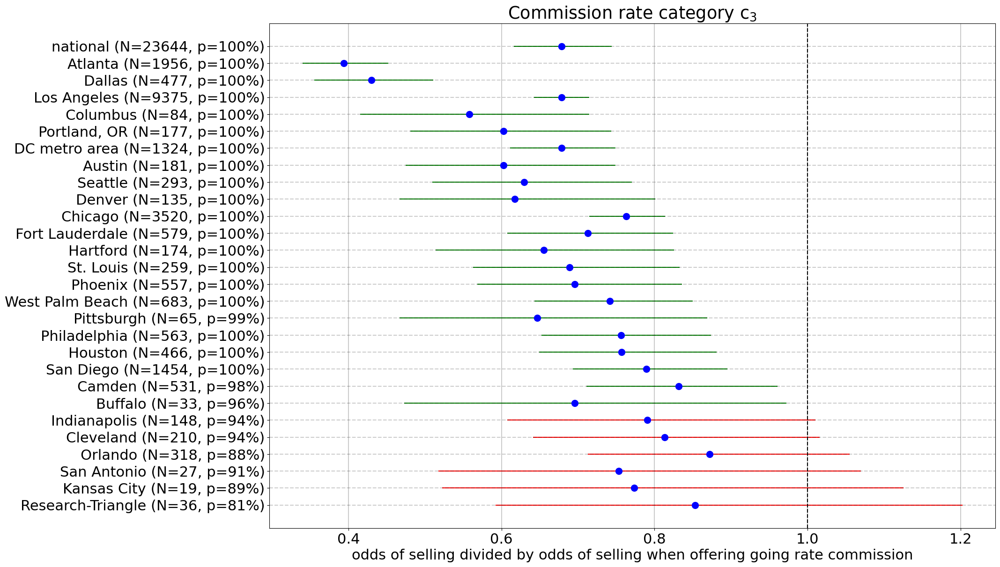

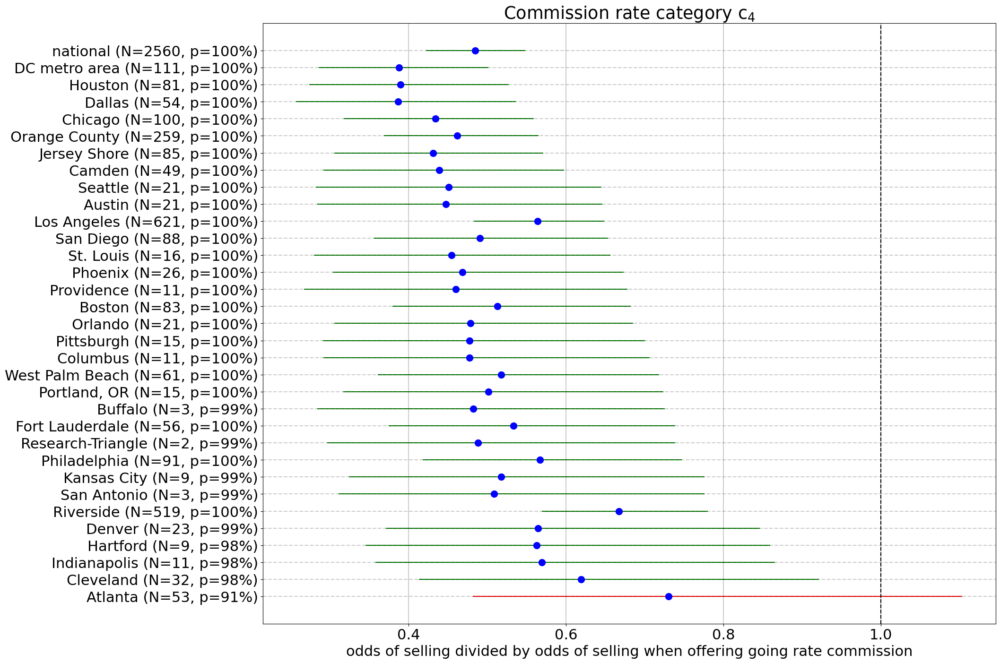

In [40]:
plot_effects(effect_df)

In [41]:
def plot_national_effects(effect_df):
    national_row = effect_df[effect_df['market_area'] == 'national']
    
    plt.figure(figsize=(20, 10))
    for i in range(1, 4):
        y = 4 - i
        x = national_row[f'mean{i}']
        xerr = (np.abs(national_row[[f'lower{i}', f'upper{i}']].to_numpy() -
                       national_row[f'mean{i}'].to_numpy().reshape(-1, 1)).T)
        is_significant = (national_row[f'upper{i}'] < 1).iloc[0]
        color = 'g' if is_significant else 'r'
        plt.errorbar(x=x, y=y, xerr=xerr, color='b', ecolor=color, capsize=0, marker='o', markersize=10, 
                     ls='none')
    plt.axvline(x=1, linestyle='--', color='k')
    plt.xlabel('odds of selling divided by odds of selling when offering going rate commission')
    xticks = plt.xticks()[0]
    first = 1 if i != 3 else 1
    for xtick in xticks[first: -1]:
        plt.axvline(x=xtick, color='k', linestyle='--', alpha=0.2)
        
    plt.ylabel('commission rate category')
    plt.yticks([1, 2, 3], ['$\mathregular{c_4}$', '$\mathregular{c_3}$', '$\mathregular{c_2}$'])
    plt.title('Selling within 90 days')
    plt.show()

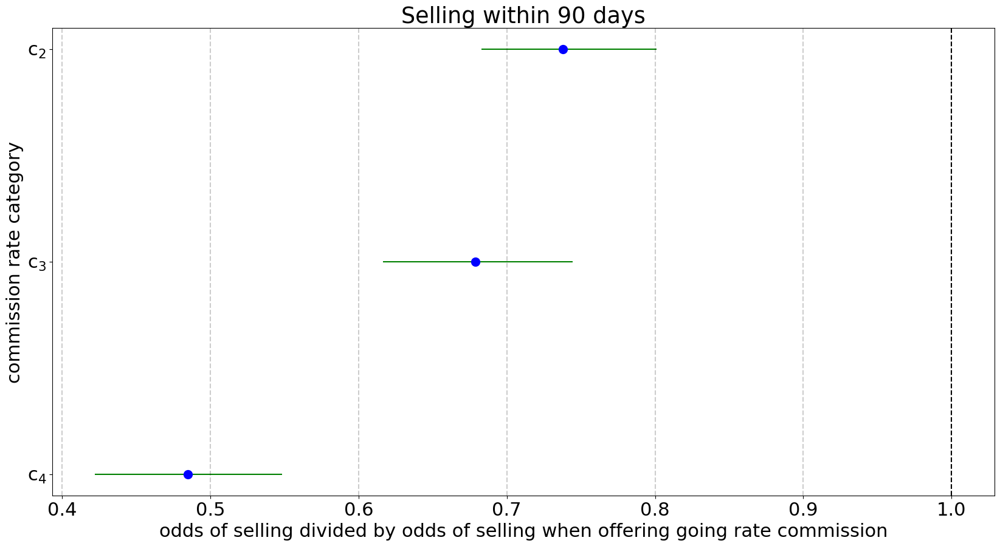

In [42]:
plot_national_effects(effect_df)

## get probabilities by market

In [43]:
def inv_logit(p):
    return 1 / (1 + np.exp(-p))

In [44]:
property_category_to_index_df = pd.read_csv('property_category_to_index_df.csv')
brokerage_to_index_df = pd.read_csv('brokerage_to_index_df.csv')

generic_brokerage_index = brokerage_to_index_df[
    brokerage_to_index_df['processed_brokerage'] == 'none']['brokerage_index'].iloc[0]

single_family_index = property_category_to_index_df[
    property_category_to_index_df['property_category'] == 'single_family']['property_category_index'].iloc[0]

In [45]:
final_df_f.groupby('market_area')['property_category_index'].agg(pd.Series.mode)

market_area
Atlanta              0
Austin               0
Boston               0
Buffalo              0
Camden               0
Chicago              0
Cleveland            0
Columbus             0
DC metro area        0
Dallas               0
Denver               0
Fort Lauderdale      0
Hartford             0
Houston              0
Indianapolis         0
Jersey Shore         0
Kansas City          0
Los Angeles          0
Orange County        0
Orlando              0
Philadelphia         2
Phoenix              0
Pittsburgh           0
Portland, OR         0
Providence           0
Research-Triangle    0
Riverside            0
San Antonio          0
San Diego            0
Seattle              0
St. Louis            0
West Palm Beach      0
Name: property_category_index, dtype: int64

In [46]:
final_df_f.groupby('market_area')['brokerage_index'].agg(pd.Series.mode)

market_area
Atlanta              0
Austin               0
Boston               0
Buffalo              0
Camden               0
Chicago              0
Cleveland            0
Columbus             0
DC metro area        0
Dallas               0
Denver               0
Fort Lauderdale      0
Hartford             0
Houston              0
Indianapolis         0
Jersey Shore         0
Kansas City          0
Los Angeles          0
Orange County        0
Orlando              0
Philadelphia         0
Phoenix              0
Pittsburgh           0
Portland, OR         0
Providence           0
Research-Triangle    0
Riverside            0
San Antonio          0
San Diego            0
Seattle              0
St. Louis            0
West Palm Beach      0
Name: brokerage_index, dtype: int64

In [47]:
alpha = 0.1
lst_of_lsts = []

for _, row in market_area_to_index_df.iterrows():
    market_area = row['market_area']
    idx = row['market_area_index']
    lst = [market_area]
    
    market_area_df = final_df_f[final_df_f['market_area'] == market_area]
    hoa = market_area_df['hoa'].median()
    opendoor = market_area_df['opendoor'].median()
    zillow = market_area_df['zillow'].median()
    offerpad = market_area_df['offerpad'].median()
    avg_views_5 = market_area_df['avg_views_5'].median()
    avg_views_10 = market_area_df['avg_views_10'].median()
    avg_views_30 = market_area_df['avg_views_30'].median()
    avg_views_100 = market_area_df['avg_views_100'].median()
    avg_views_200 = market_area_df['avg_views_200'].median()
    null_price = int(market_area_df['null_redfin_price_estimate'].median())
    price_indicator = int(market_area_df['price_range'].median())
    beds_indicator = int(market_area_df['beds_range'].median())
    baths_indicator = int(market_area_df['baths_range'].median())
    sqft_indicator = int(market_area_df['sqft_range'].median())
    year_built_indicator = int(market_area_df['year_built_range'].median())
    price_difference_pct_indicator = int(market_area_df['price_difference_pct_range'].median())
    brokerage_listings_pct_indicator = int(market_area_df['brokerage_listings_pct_range'].median())
    created_month_indicator = int(market_area_df['created_month_index'].median())
    
    common_lin_pred_func = (
        trace['b_intercept'][:, idx] +
        hoa * trace['b_hoa'][:, idx] +
        opendoor * trace['b_opendoor'][:, idx] +
        zillow * trace['b_zillow'][:, idx] +
        offerpad * trace['b_offerpad'][:, idx] +
        avg_views_5 * trace['b_avg_views_5'][:, idx] +
        avg_views_10 * trace['b_avg_views_10'][:, idx] +
        avg_views_30 * trace['b_avg_views_30'][:, idx] + 
        avg_views_100 * trace['b_avg_views_100'][:, idx] +
        avg_views_200 * trace['b_avg_views_200'][:, idx] +
        null_price * trace['b_null_price'][:, idx] +
        trace['b_price'][:, idx, price_indicator] +
        trace['b_beds'][:, idx, beds_indicator] +
        trace['b_baths'][:, idx, baths_indicator] +
        trace['b_sqft'][:, idx, sqft_indicator] +
        trace['b_year_built'][:, idx, year_built_indicator] +
        trace['b_price_difference_pct'][:, idx, price_difference_pct_indicator] +
        trace['b_property_category'][:, idx, single_family_index] + 
        trace['b_brokerage'][:, idx, generic_brokerage_index] + 
        trace['b_brokerage_listings_pct'][:, idx, brokerage_listings_pct_indicator] +
        trace['b_created_month'][:, idx, created_month_indicator]
    )
    
    c0_lin_pred_func = common_lin_pred_func + trace['b_comm'][:, idx, 0]
    c0_probs = 1 - inv_logit(c0_lin_pred_func)
    lst.append(100 * c0_probs.mean())
    
    for i in range(1, 4):
        lin_pred_func = common_lin_pred_func + trace['b_comm'][:, idx, i]
        probs = 1 - inv_logit(lin_pred_func)
        probs_pct_diff = 100 * ((probs / c0_probs) - 1)
        mean_probs_pct_diff = np.mean(probs_pct_diff)
        quantiles = np.quantile(probs_pct_diff, [alpha / 2, 1 - (alpha / 2)])
        lst.extend([mean_probs_pct_diff] + list(quantiles) + [(probs_pct_diff <= 0).mean()])
    lst_of_lsts.append(lst)

    
columns = ['market_area', 'c0_prob', 'mean1', 'lower1', 'upper1', 'pvalue1', 'mean2', 'lower2', 'upper2', 
           'pvalue2', 'mean3', 'lower3', 'upper3', 'pvalue3']
probs_pct_diff_df = pd.DataFrame(lst_of_lsts, columns=columns)

In [48]:
just_under_market_areas = [market_area for market_area, cutoffs in market_area_to_commission_cutoffs.items()
                               if len(cutoffs) == 3 and market_area in market_areas_to_consider]

above_2_market_areas = [market_area for market_area, cutoffs in market_area_to_commission_cutoffs.items()
                        if cutoffs[0] != 2]

In [54]:
for i in range(1, 4):
    show_df = probs_pct_diff_df[probs_pct_diff_df['market_area'].isin(
        final_df_f[final_df_f['buyside_commission_range'] == i]['market_area'].unique())][
        ['market_area'] + [col for col in probs_pct_diff_df.columns if col.endswith(str(i))]]
    
    show_df.sort_values('market_area', inplace=True)
    
    def get_interval(row):
        lower = round(row[f'lower{i}'], 1)
        upper = round(row[f'upper{i}'], 1)
        return f'[{lower}%; {upper}%]'  
    
    show_df['90% interval'] = show_df.apply(get_interval, axis=1)
    show_df.drop(columns=[f'lower{i}', f'upper{i}'], inplace=True)
    show_df[f'mean{i}'] = show_df[f'mean{i}'].round(1)
    show_df['prob_above_zero'] = (100 * (1 - show_df[f'pvalue{i}'])).round(1)
    show_df['prob_above_zero'] = show_df['prob_above_zero'].apply(lambda x: f'{x}%')
    show_df = show_df[['market_area', f'mean{i}', '90% interval', 'prob_above_zero']]
    print(len(show_df))
    display(show_df)
    
    show_df.to_csv(f'~/downloads/prob_df_{i}.csv', index=False)

12


,market_area,mean1,90% interval,prob_above_zero
0,Atlanta,45.0,[31.9%; 58.6%],100.0%
1,Austin,21.1,[8.3%; 34.0%],99.5%
3,Buffalo,31.5,[14.0%; 53.1%],99.8%
7,Columbus,31.9,[13.3%; 54.9%],99.9%
9,Dallas,19.0,[4.1%; 35.6%],97.8%
10,Denver,25.2,[12.0%; 38.9%],100.0%
13,Houston,19.1,[10.1%; 28.3%],100.0%
14,Indianapolis,10.2,[-4.9%; 25.5%],86.6%
16,Kansas City,30.0,[13.6%; 50.1%],99.8%
23,"Portland, OR",22.1,[7.2%; 37.8%],99.0%


27


,market_area,mean2,90% interval,prob_above_zero
0,Atlanta,115.5,[88.0%; 143.9%],100.0%
1,Austin,51.0,[25.1%; 78.4%],100.0%
3,Buffalo,37.4,[2.8%; 78.5%],96.2%
4,Camden,17.5,[5.6%; 30.3%],99.2%
5,Chicago,23.9,[17.9%; 30.1%],100.0%
6,Cleveland,9.8,[-0.7%; 22.1%],94.2%
7,Columbus,59.7,[29.1%; 96.4%],100.0%
8,DC metro area,30.6,[21.4%; 40.2%],100.0%
9,Dallas,118.2,[82.0%; 160.0%],100.0%
10,Denver,72.4,[34.3%; 116.8%],100.0%


32


,market_area,mean3,90% interval,prob_above_zero
0,Atlanta,33.1,[-18.0%; 90.8%],84.2%
1,Austin,64.4,[11.5%; 121.5%],97.7%
2,Boston,77.0,[28.5%; 129.9%],99.9%
3,Buffalo,96.2,[27.9%; 183.6%],99.4%
4,Camden,85.8,[50.5%; 128.6%],100.0%
5,Chicago,67.5,[37.5%; 97.9%],100.0%
6,Cleveland,16.4,[-3.4%; 37.2%],92.1%
7,Columbus,53.4,[-5.0%; 116.2%],93.2%
8,DC metro area,98.0,[67.4%; 130.3%],100.0%
9,Dallas,156.8,[78.6%; 249.5%],100.0%


In [50]:
def plot_prob_diff_effects(effect_df):
    just_under_market_areas = [market_area for market_area, cutoffs in market_area_to_commission_cutoffs.items()
                               if len(cutoffs) == 3 and market_area in market_areas_to_consider]

    above_2_market_areas = [market_area for market_area, cutoffs in market_area_to_commission_cutoffs.items()
                            if cutoffs[0] != 2]

    for i in range(1, 4):
        if i == 1:
            df = effect_df[effect_df['market_area'].isin(just_under_market_areas)]
        elif i == 2:
            df = effect_df[effect_df['market_area'].isin(above_2_market_areas)]
        else:
            df = effect_df.copy()
        df.sort_values(f'lower{i}', ascending=False, inplace=True)
        
        plt.figure(figsize=(20, max(10, len(df) / 2)))
        y = [x for x in range(len(df), 0, -1)]
        x = df[f'mean{i}']
        xerr = (np.abs(df[[f'lower{i}', f'upper{i}']].to_numpy() -
                       df[f'mean{i}'].to_numpy().reshape(-1, 1)).T)
        is_significant = df[f'lower{i}'] > 0
        colors = ['g' if x else 'r' for x in is_significant]
        plt.errorbar(x=x, y=y, xerr=xerr, color='b', ecolor=colors, capsize=0, marker='o', markersize=10, 
                     ls='none')
        plt.axvline(x=0, linestyle='--', color='k')
        
        yticks = []
        for market_area in df['market_area']:
            num_listings = len(final_df_f[(final_df_f['buyside_commission_range'] == i) &
                                          (final_df_f['market_area'] == market_area)])
            c0_prob = df[df['market_area'] == market_area]['c0_prob'].iloc[0]
            yticks.append(f'{market_area} (N={num_listings}, $Pr(c_1)$={round(c0_prob, 1)}%)')
        
        plt.yticks(y, yticks)
        plt.xlabel(('percent difference in probability of not selling compared ' +
                    'to listings offering going rate commission'))
        xticks = plt.xticks()[0]
        for xtick in xticks[1: -1]:
            plt.axvline(x=xtick, color='k', linestyle='-', alpha=0.2)
        plt.title(i_to_title[i])
        
        yticks = plt.yticks()[0]
        for ytick in yticks:
            plt.axhline(y=ytick, color='k', linestyle='--', alpha=0.2)
        plt.gca().set_xticklabels([f'{x/100:.0%}' for x in plt.gca().get_xticks()])
        plt.show()

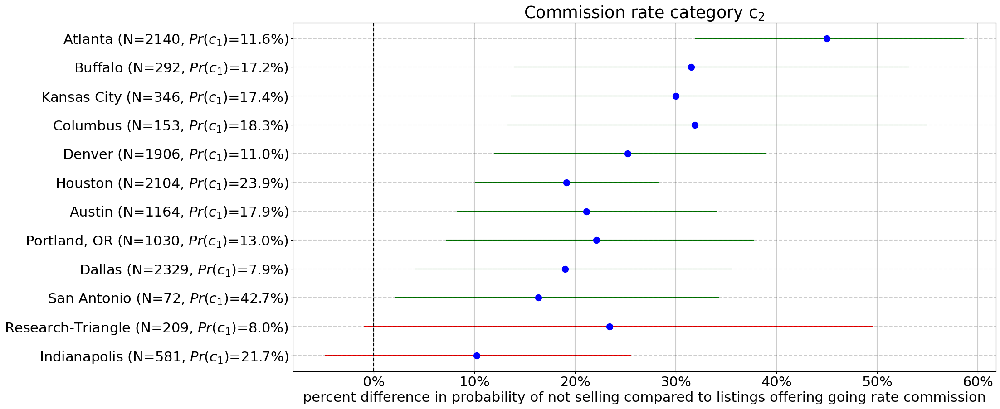

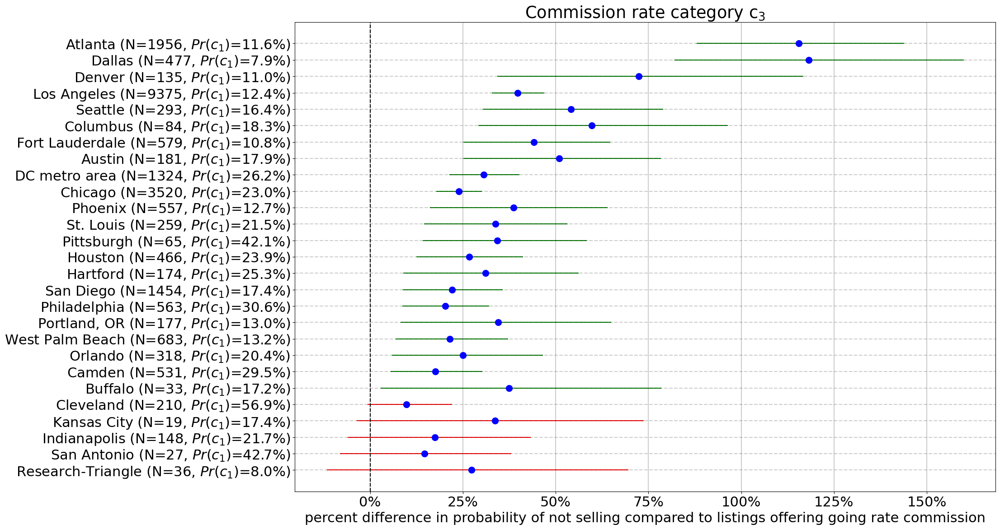

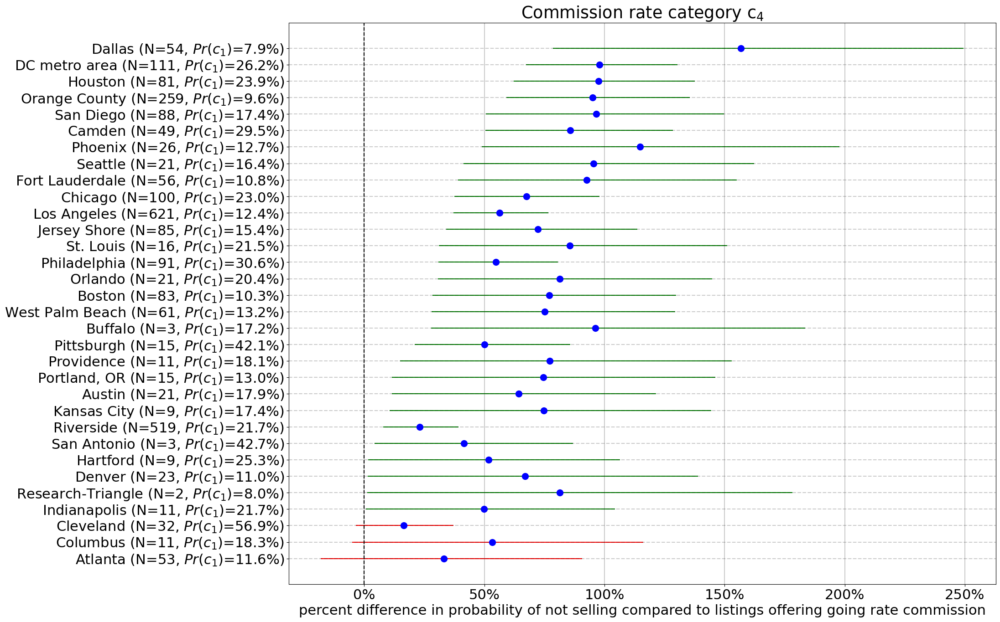

In [51]:
plot_prob_diff_effects(probs_pct_diff_df)

## explore results

In [53]:
def plot_effect_of_variables(variable, 
                             x_label=None, 
                             y_label='beta coefficient value', 
                             alpha=0.05):

    b_samples_mat = trace[variable]
    
    for _, row in market_area_to_index_df.iterrows():
        market_area = row['market_area']
        market_area_index = row['market_area_index']
        b_samples = b_samples_mat[:, market_area_index, :]
        range_vals = b_samples.shape[1]

        null_frac = final_df_f[
            final_df_f['market_area'] == market_area]['null_redfin_price_estimate'].mean()
        
        if variable == 'b_price_difference_pct':
            print('fraction of homes with null Redfin price estimate:', round(null_frac, 3))
            
        plt.figure(figsize=(20, 10))
        x_vals = []
        y_vals = []
        y_err = np.zeros((2, range_vals - 1))
        for i in range(range_vals - 1):
            samples = b_samples[:, i + 1] - b_samples[:, 0]
            x_vals.append(i + 2)
            sample_mean = np.mean(samples)
            y_vals.append(sample_mean)
            quantiles = np.quantile(samples, [alpha / 2, 1 - (alpha / 2)])
            errors = np.abs(quantiles - sample_mean)
            y_err[:, i] = errors

        plt.errorbar(x=x_vals, y=y_vals, yerr=y_err, capsize=0, marker='o', markersize=10, ls='none')
        plt.xlabel(x_label)
        plt.ylabel(y_label)
        plt.title(market_area)

        yticks = plt.yticks()[0]
        for ytick in yticks[1: -1]:
                plt.axhline(y=ytick, color='k', linestyle='--', alpha=0.2)

        plt.show()

fraction of homes with null Redfin price estimate: 0.054


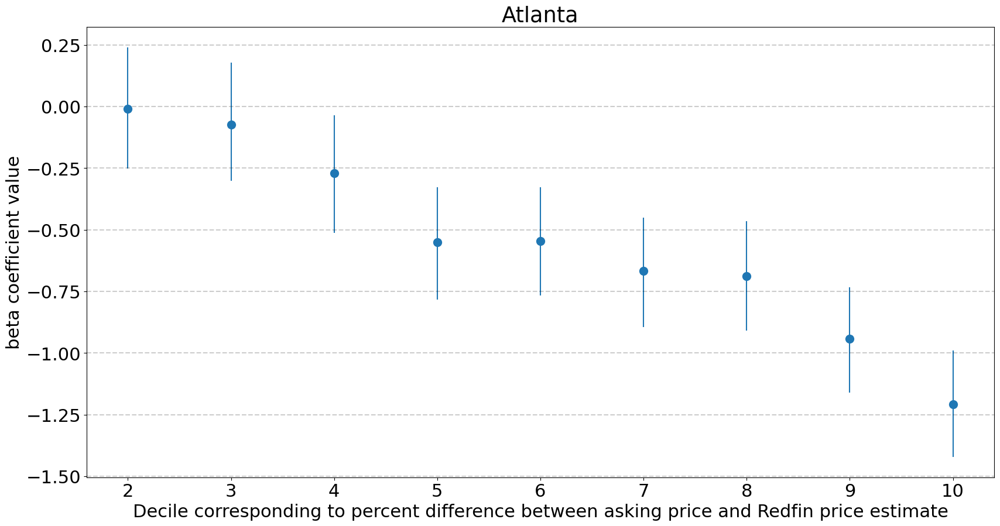

fraction of homes with null Redfin price estimate: 0.745


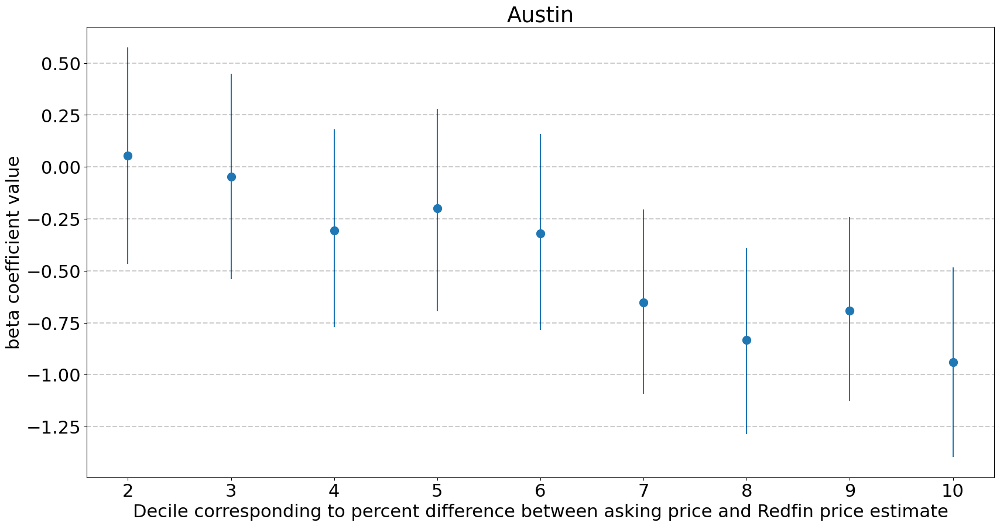

fraction of homes with null Redfin price estimate: 0.052


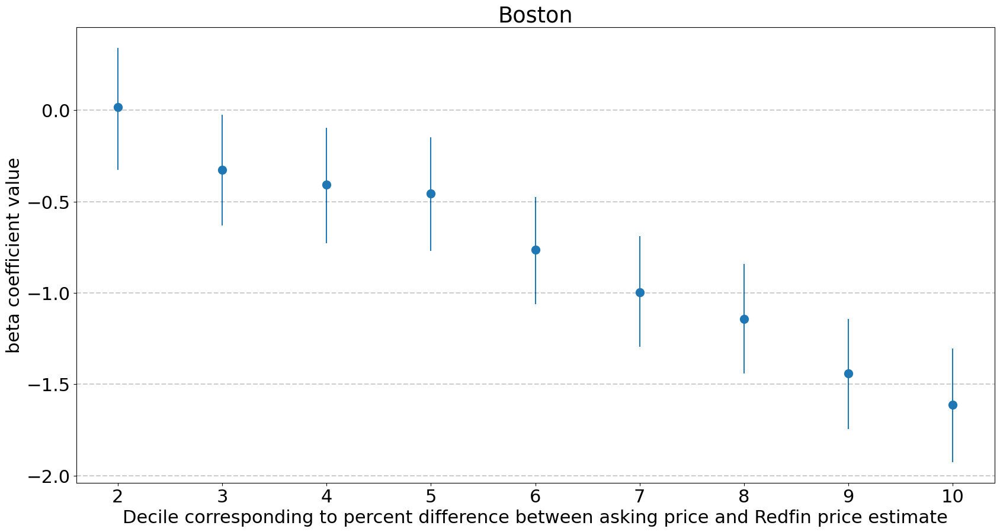

fraction of homes with null Redfin price estimate: 0.343


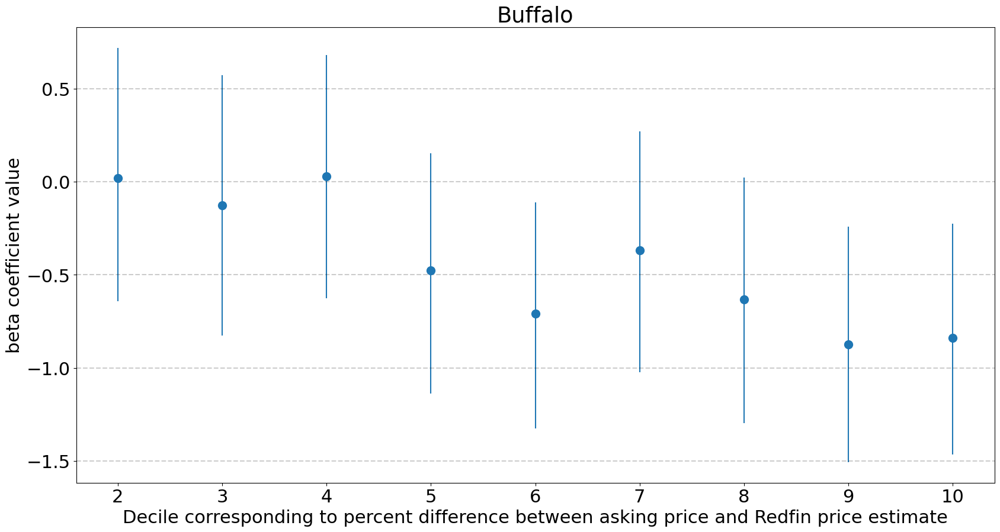

fraction of homes with null Redfin price estimate: 0.198


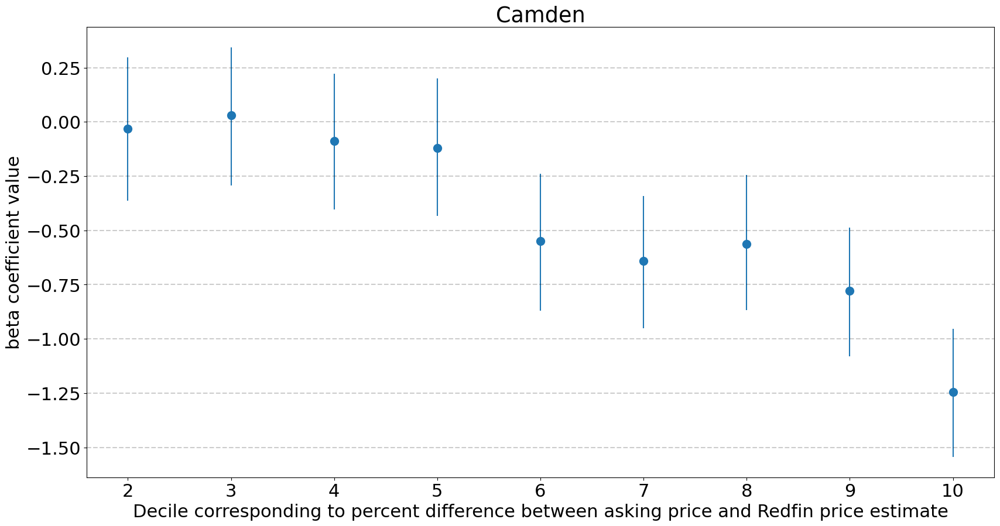

fraction of homes with null Redfin price estimate: 0.714


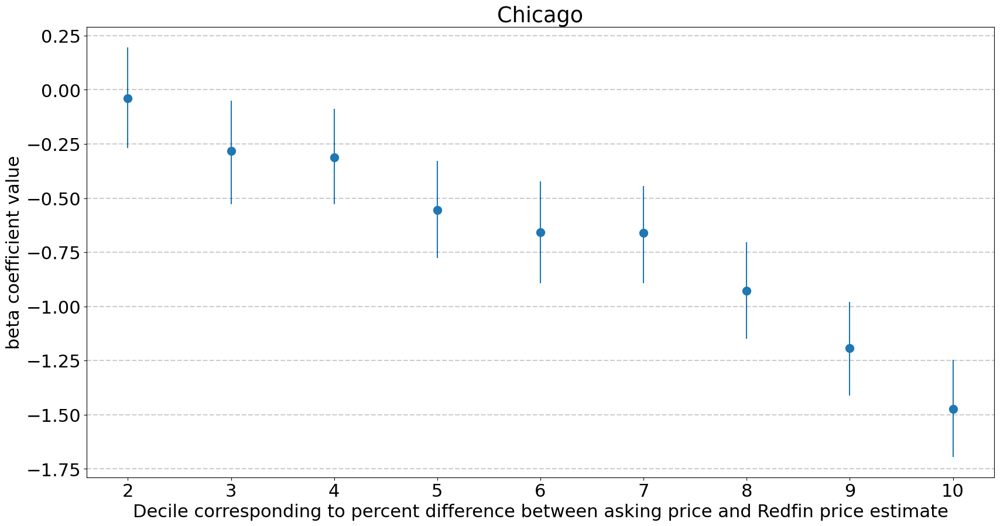

fraction of homes with null Redfin price estimate: 0.008


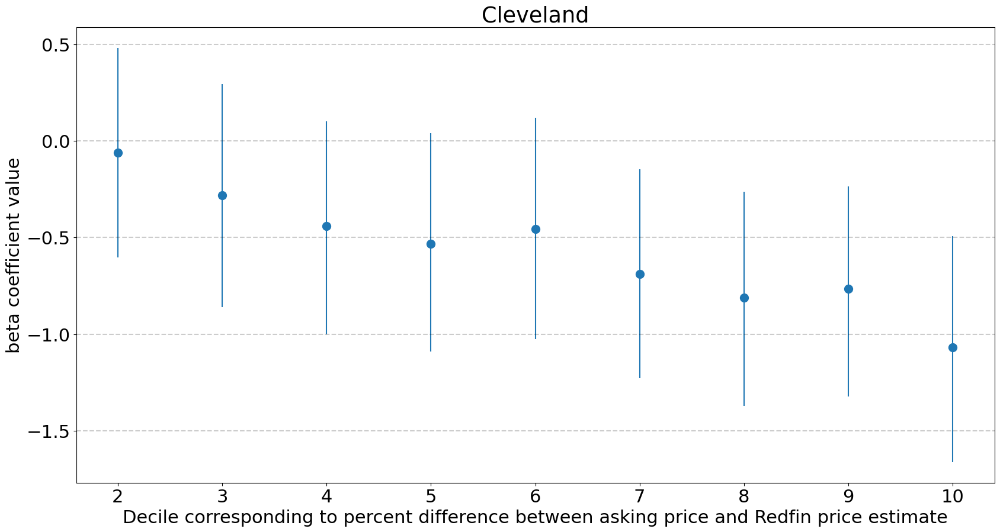

fraction of homes with null Redfin price estimate: 0.916


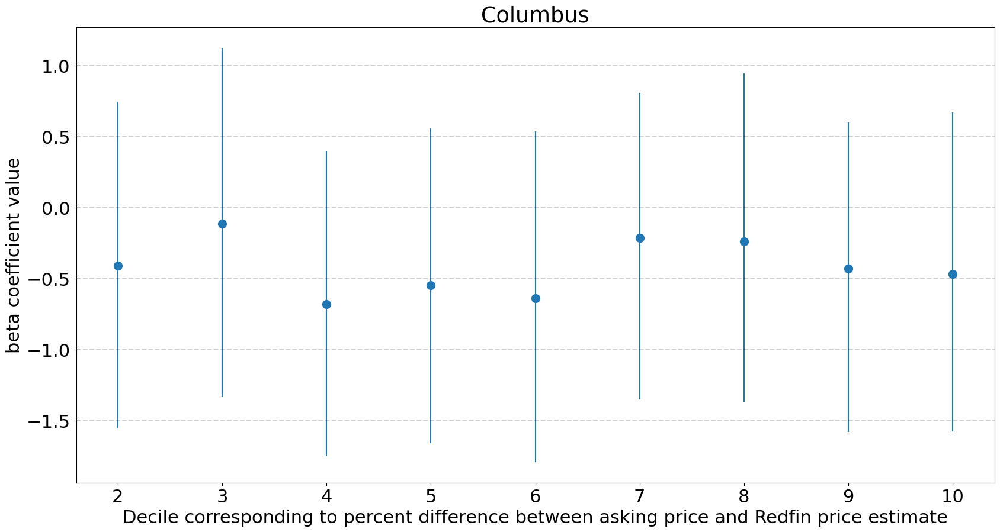

fraction of homes with null Redfin price estimate: 0.185


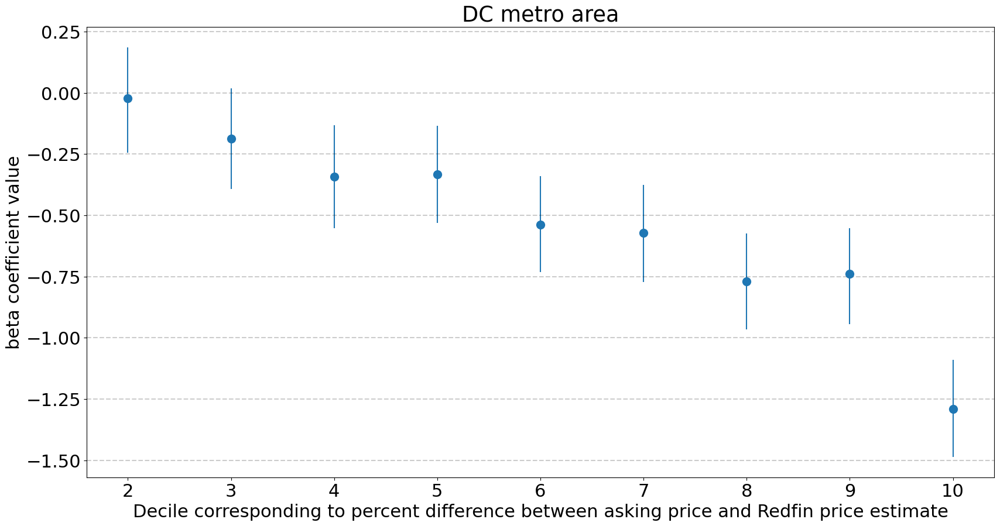

fraction of homes with null Redfin price estimate: 0.303


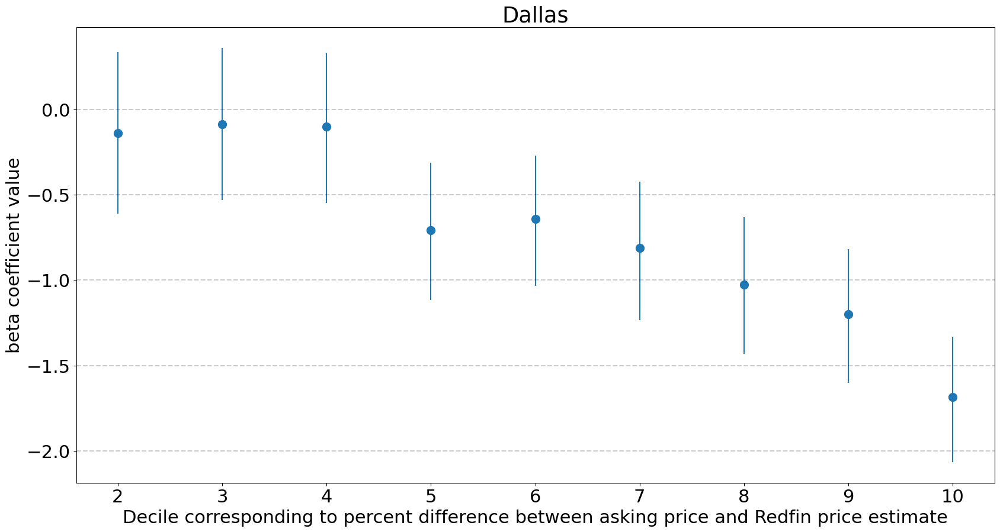

fraction of homes with null Redfin price estimate: 0.145


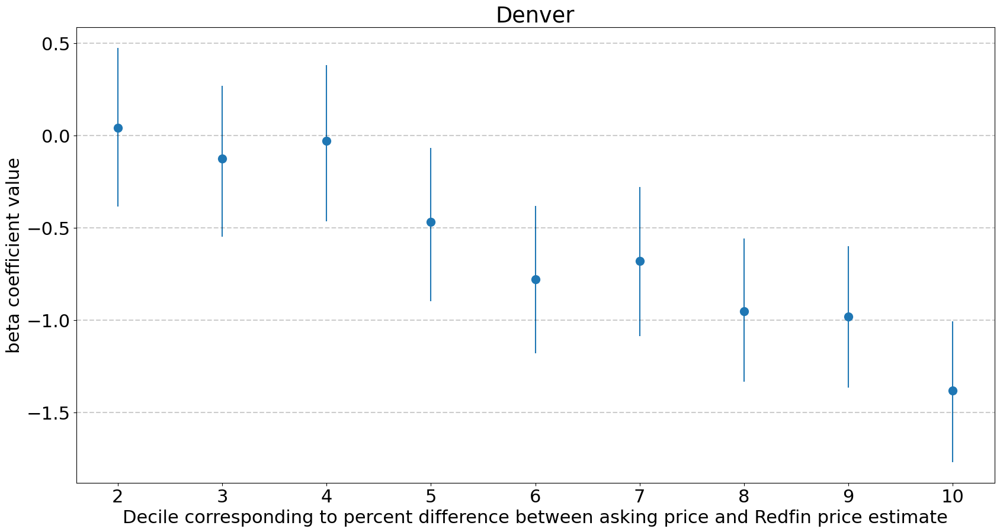

fraction of homes with null Redfin price estimate: 0.229


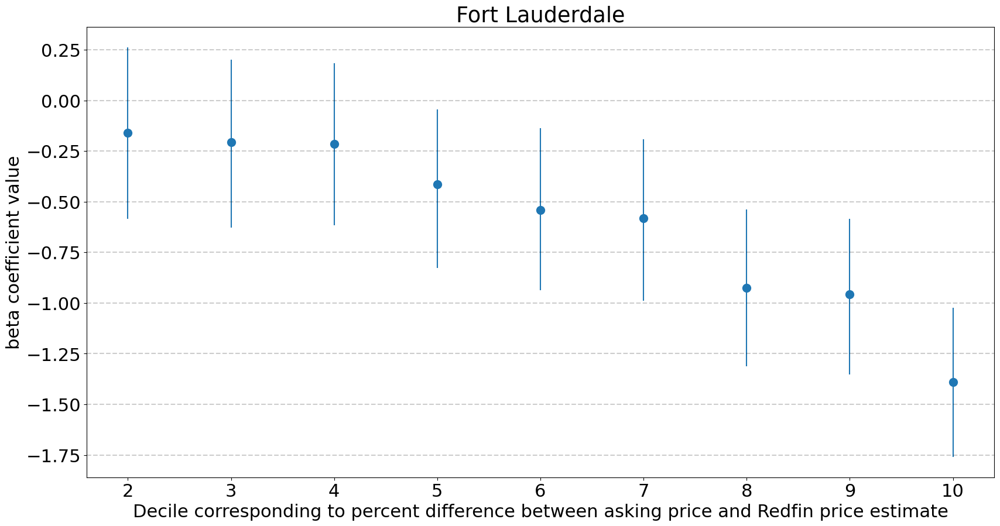

fraction of homes with null Redfin price estimate: 0.363


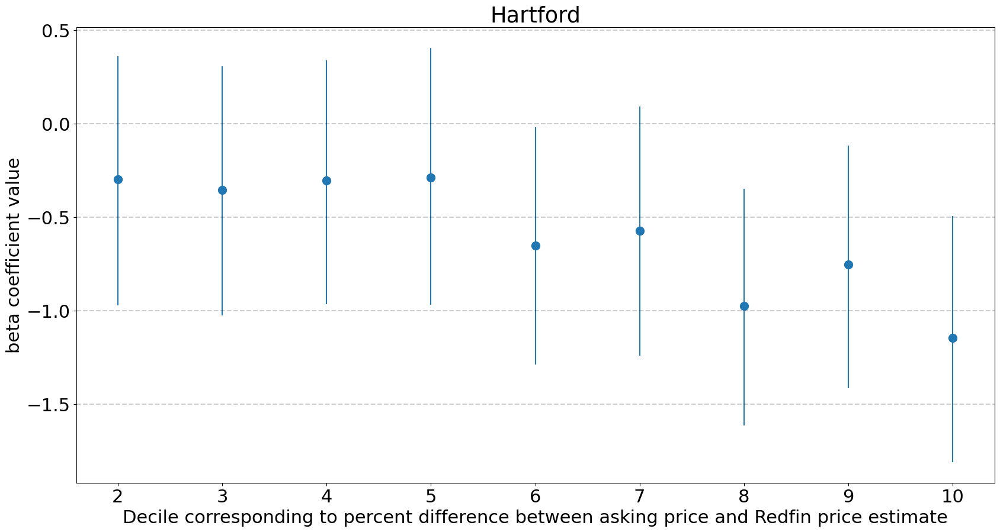

fraction of homes with null Redfin price estimate: 0.051


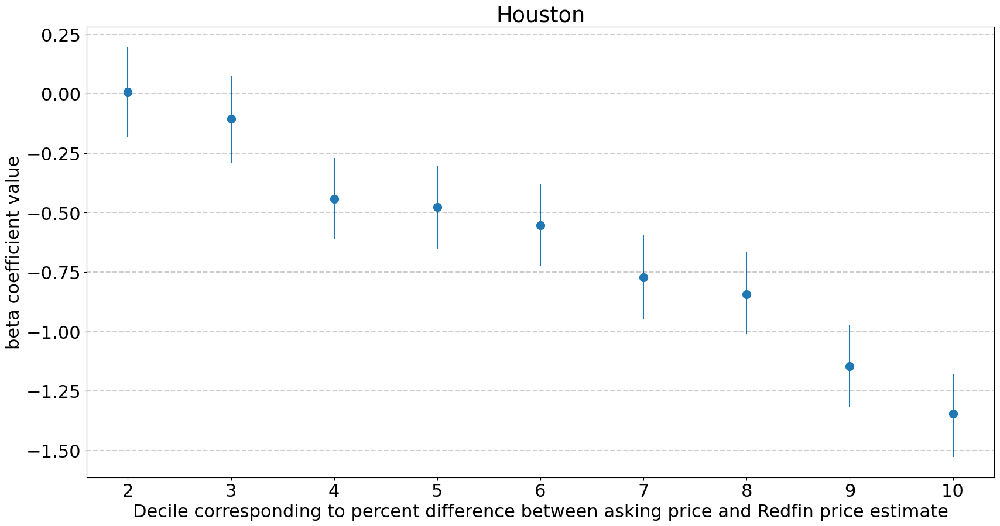

fraction of homes with null Redfin price estimate: 0.736


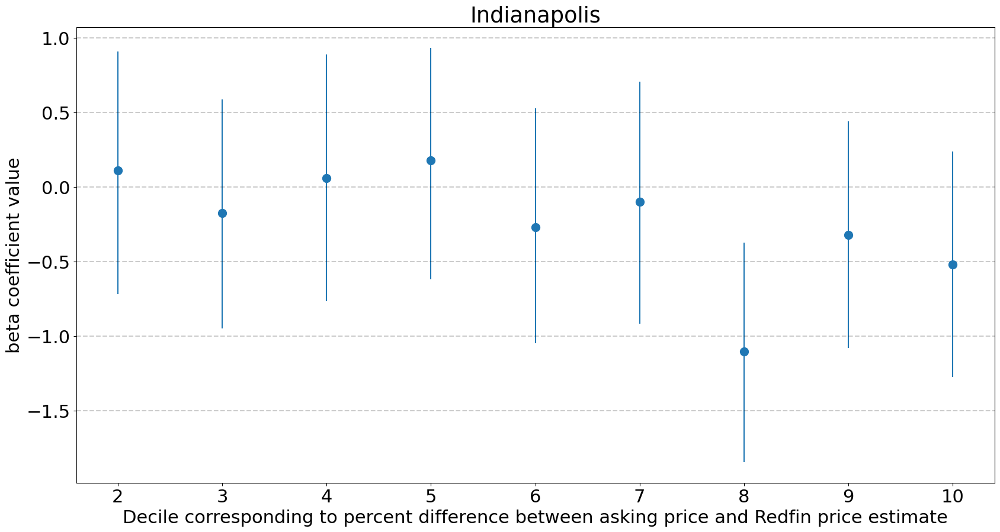

fraction of homes with null Redfin price estimate: 0.208


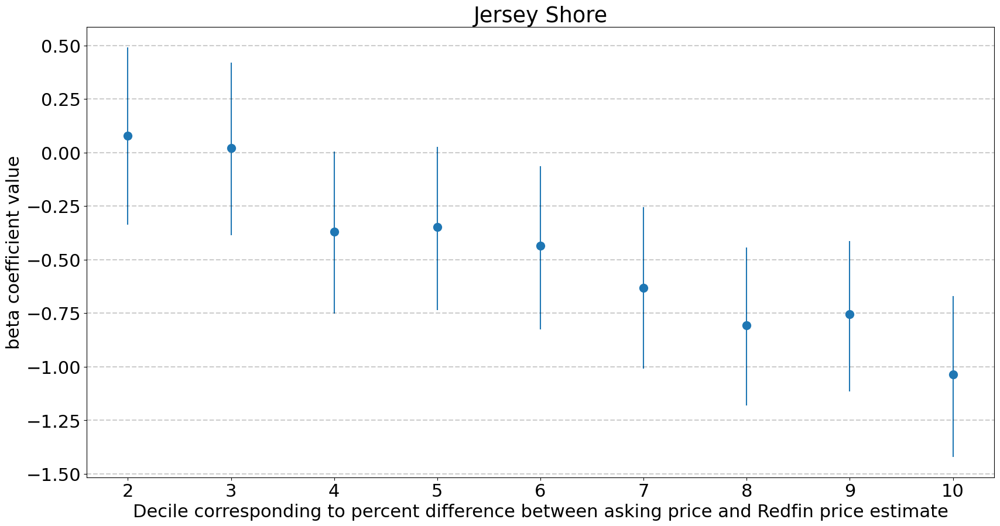

fraction of homes with null Redfin price estimate: 0.966


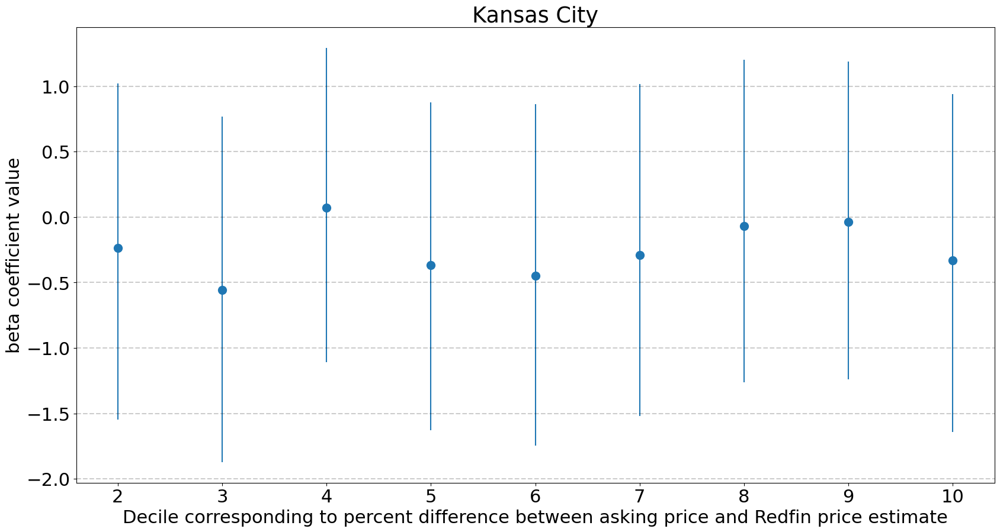

fraction of homes with null Redfin price estimate: 0.16


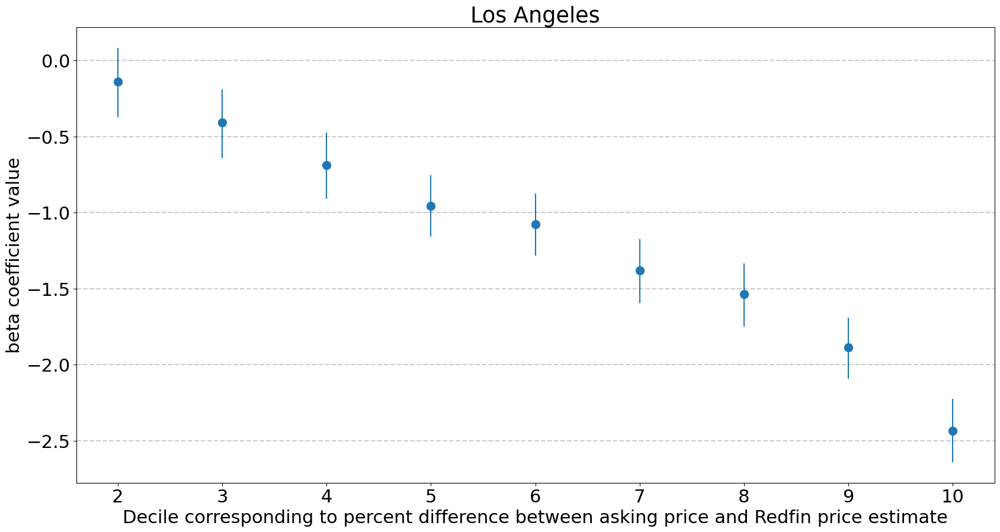

fraction of homes with null Redfin price estimate: 0.24


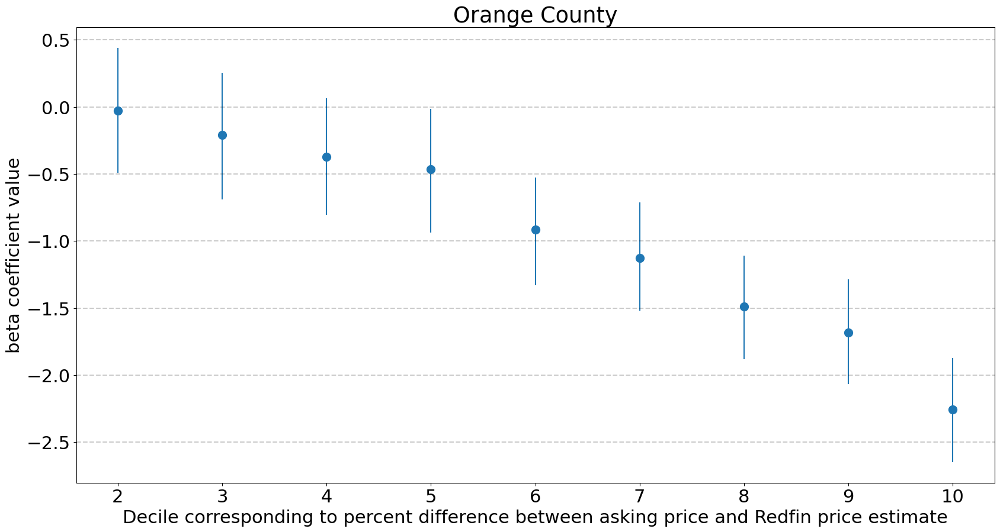

fraction of homes with null Redfin price estimate: 0.315


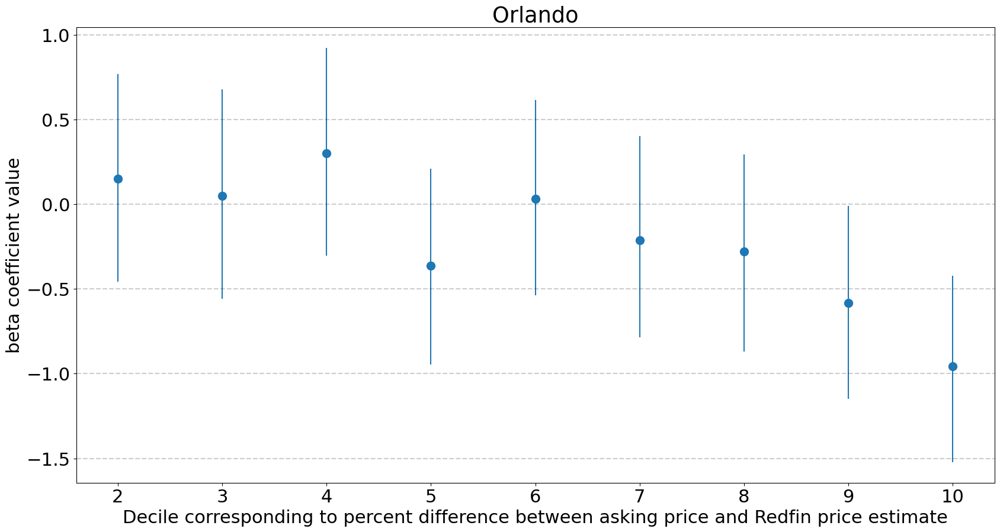

fraction of homes with null Redfin price estimate: 0.133


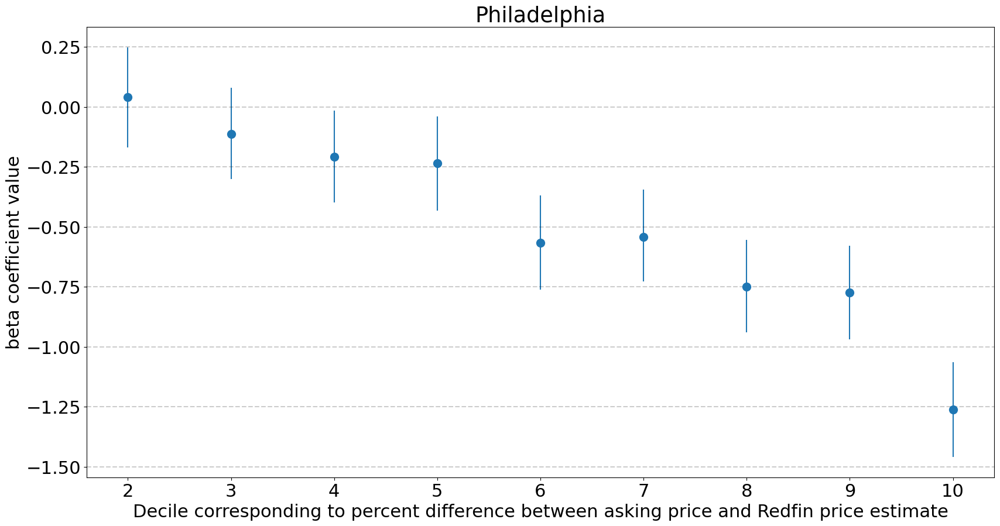

fraction of homes with null Redfin price estimate: 0.958


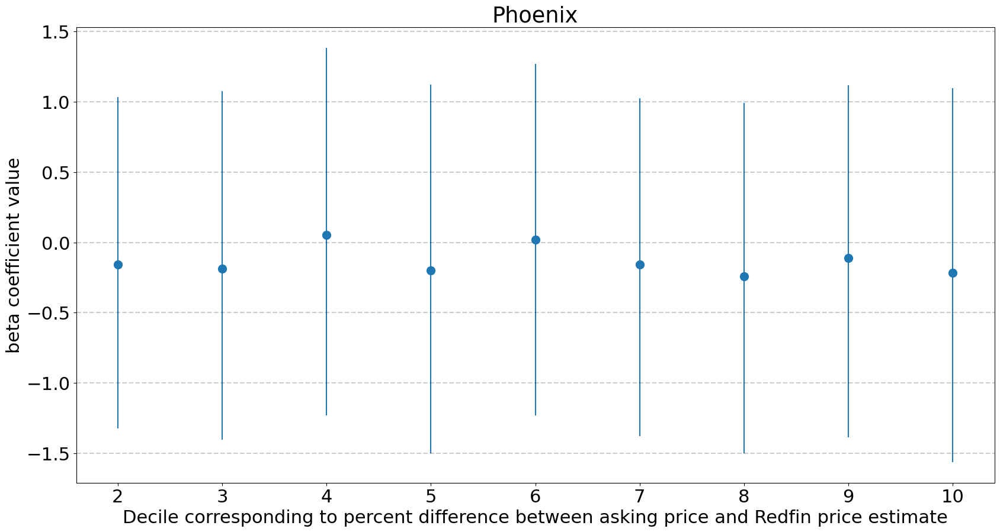

fraction of homes with null Redfin price estimate: 0.009


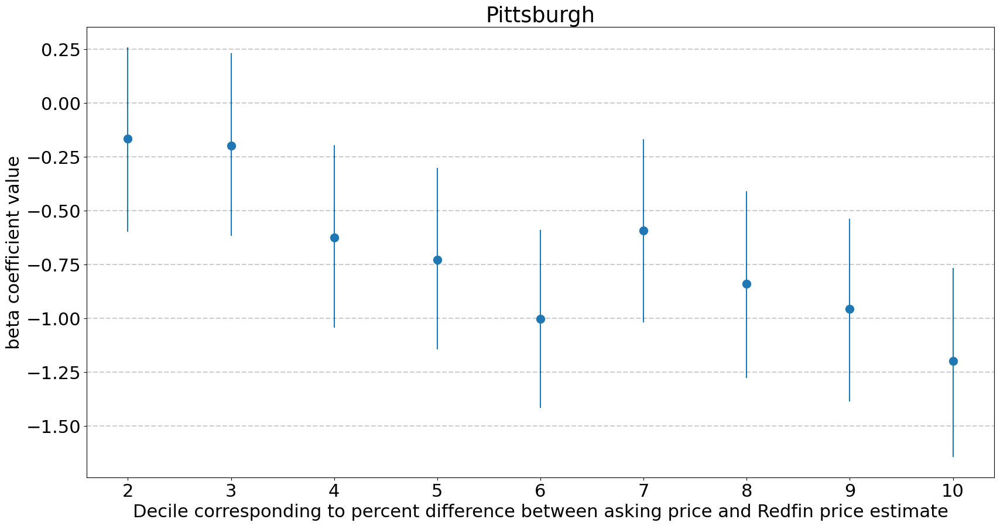

fraction of homes with null Redfin price estimate: 0.264


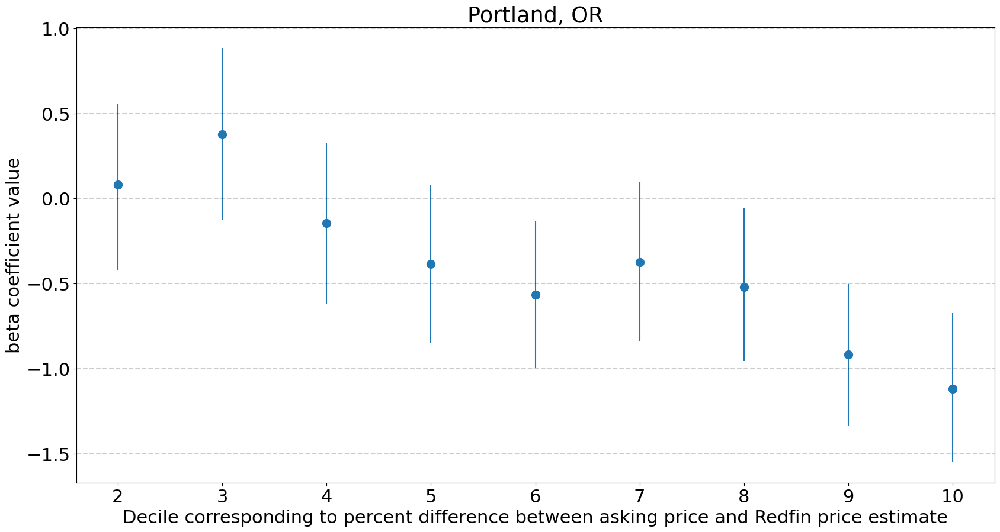

fraction of homes with null Redfin price estimate: 0.313


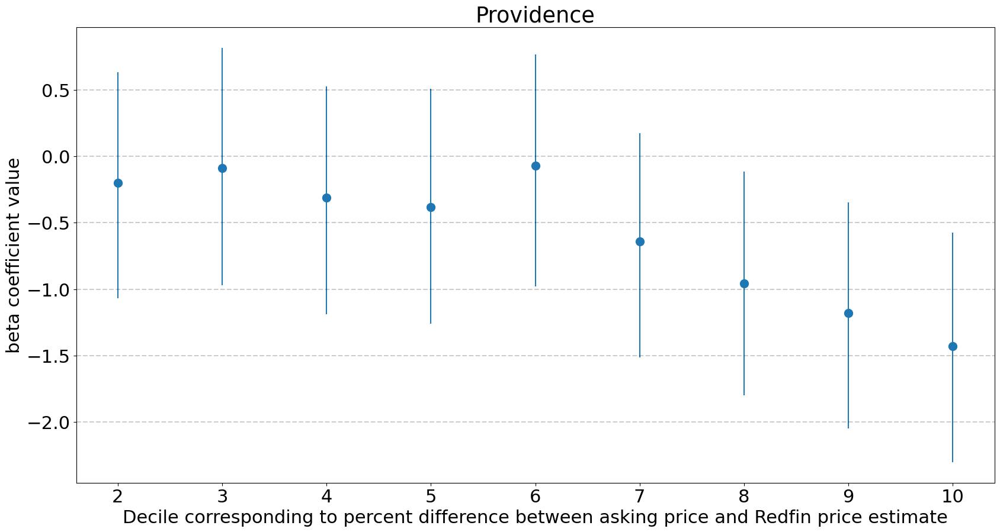

fraction of homes with null Redfin price estimate: 0.461


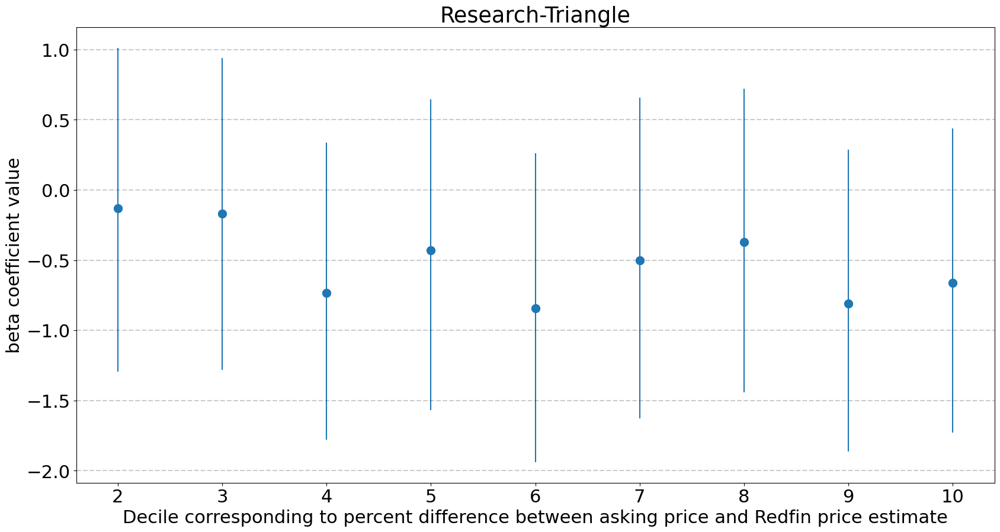

fraction of homes with null Redfin price estimate: 0.221


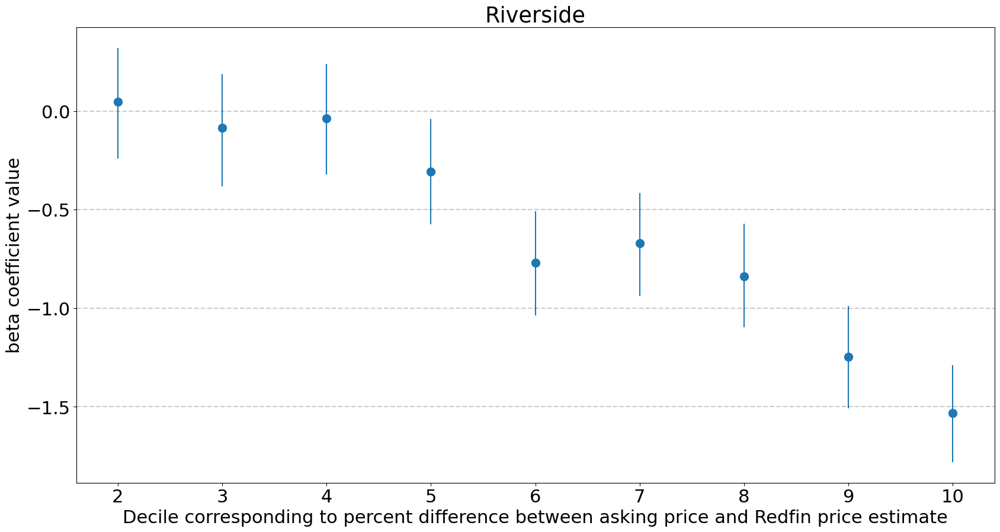

fraction of homes with null Redfin price estimate: 0.675


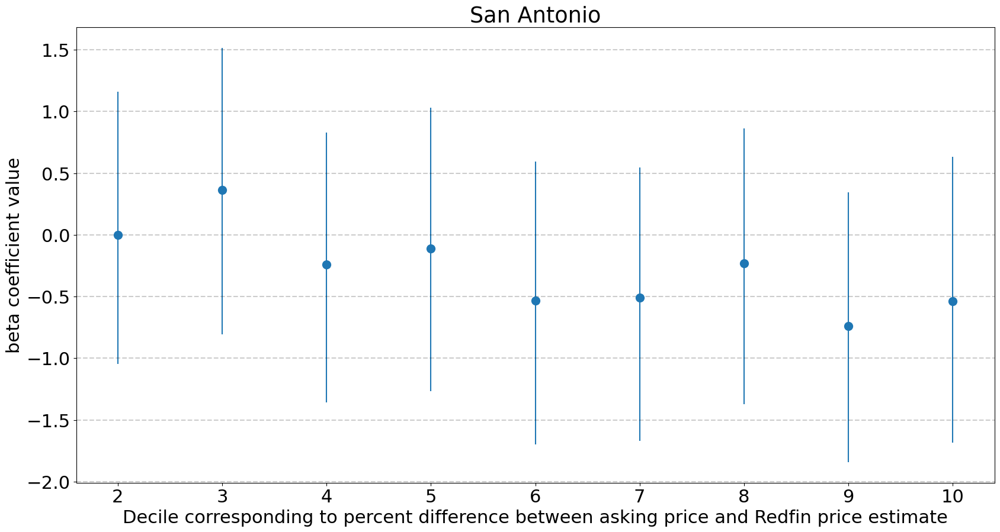

fraction of homes with null Redfin price estimate: 0.26


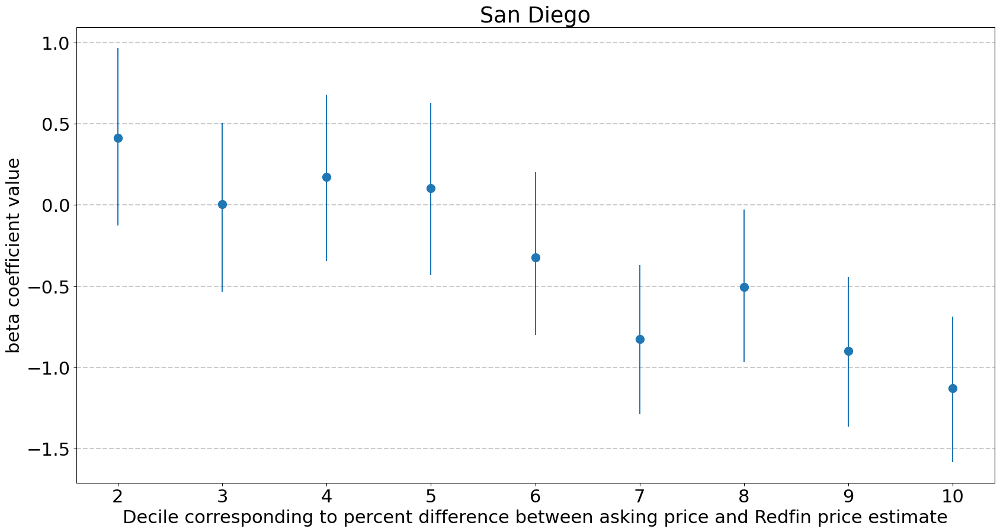

fraction of homes with null Redfin price estimate: 0.159


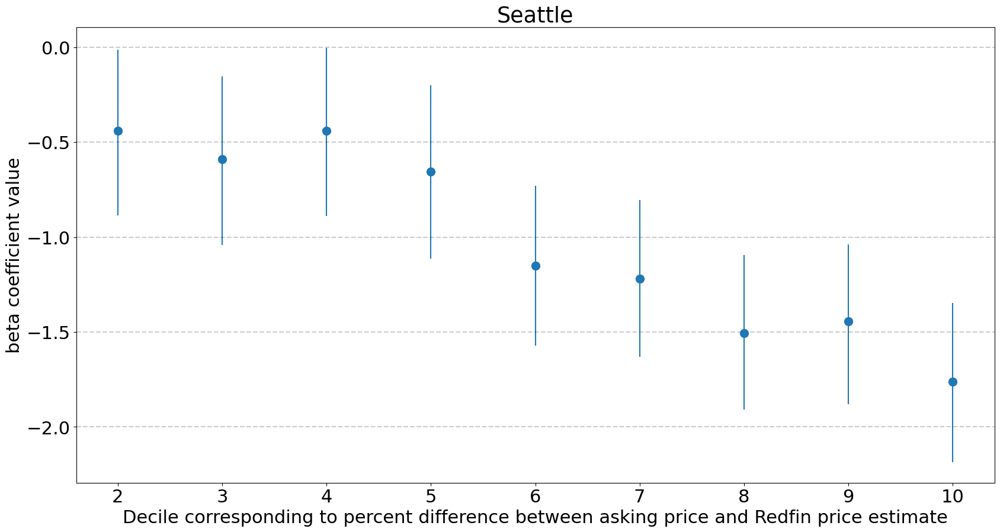

fraction of homes with null Redfin price estimate: 0.328


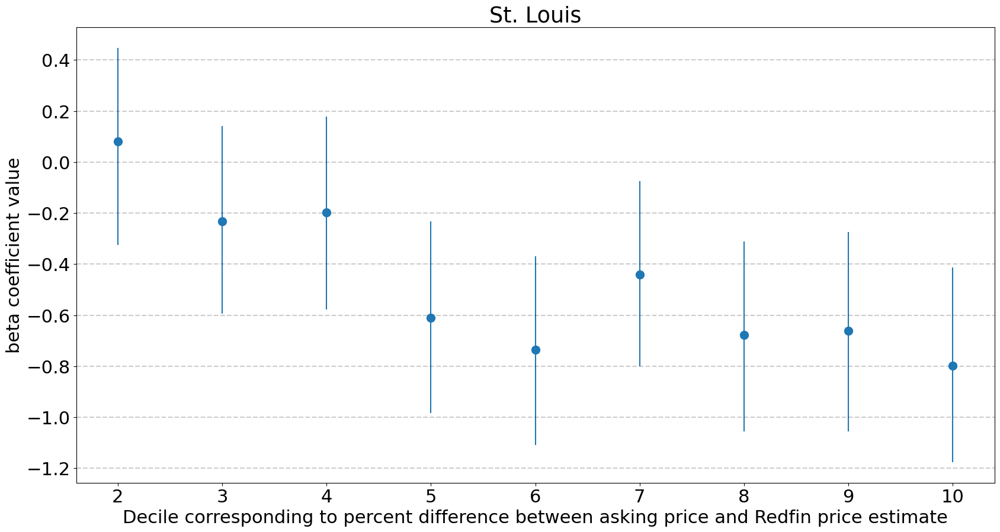

fraction of homes with null Redfin price estimate: 0.173


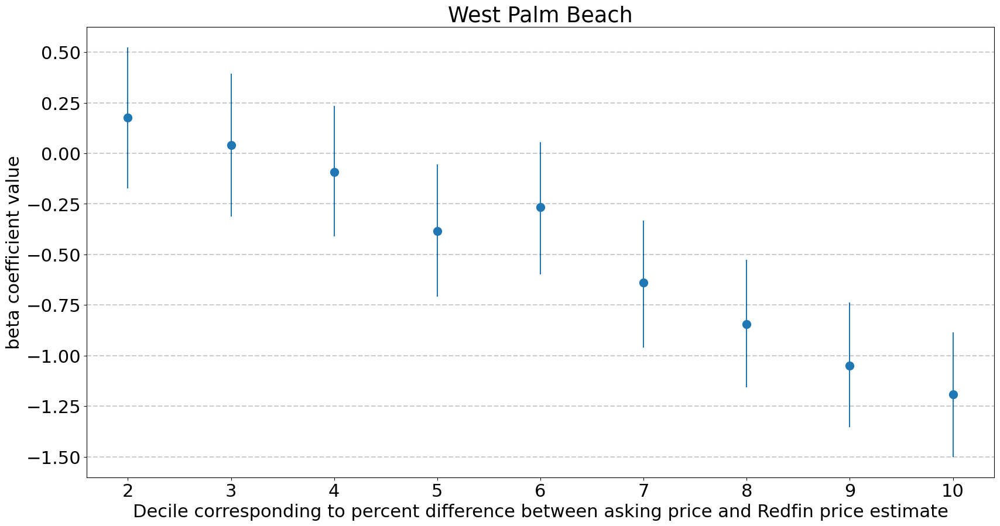

In [54]:
plot_effect_of_variables(
    'b_price_difference_pct', 
    x_label='Decile corresponding to percent difference between asking price and Redfin price estimate')

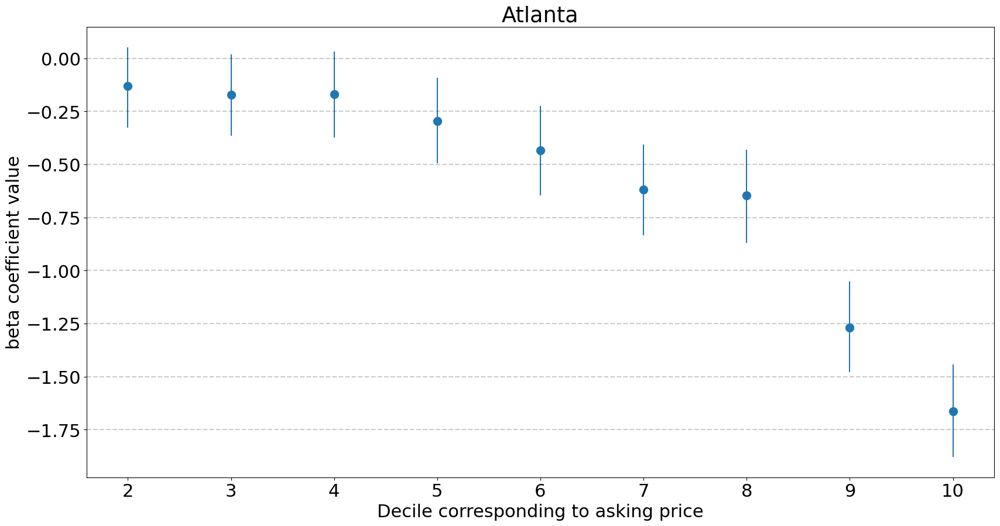

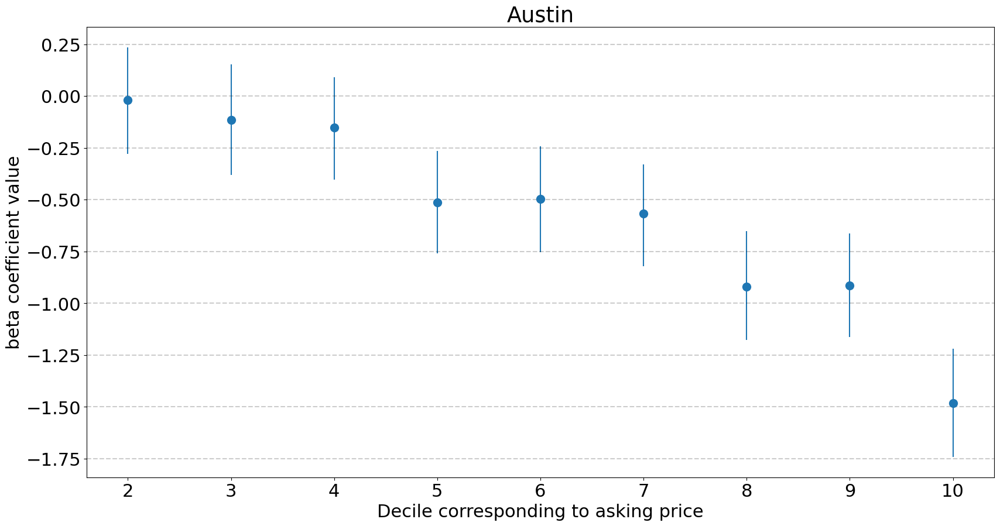

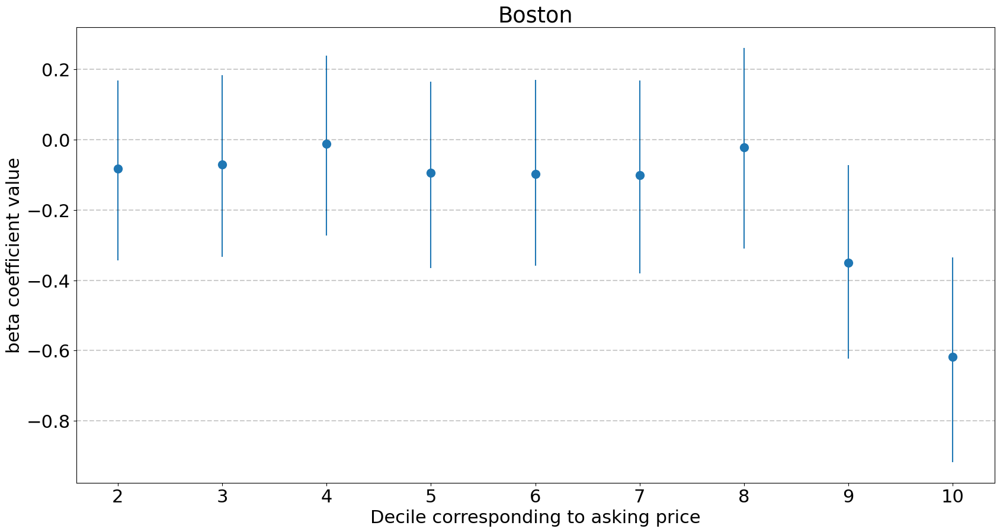

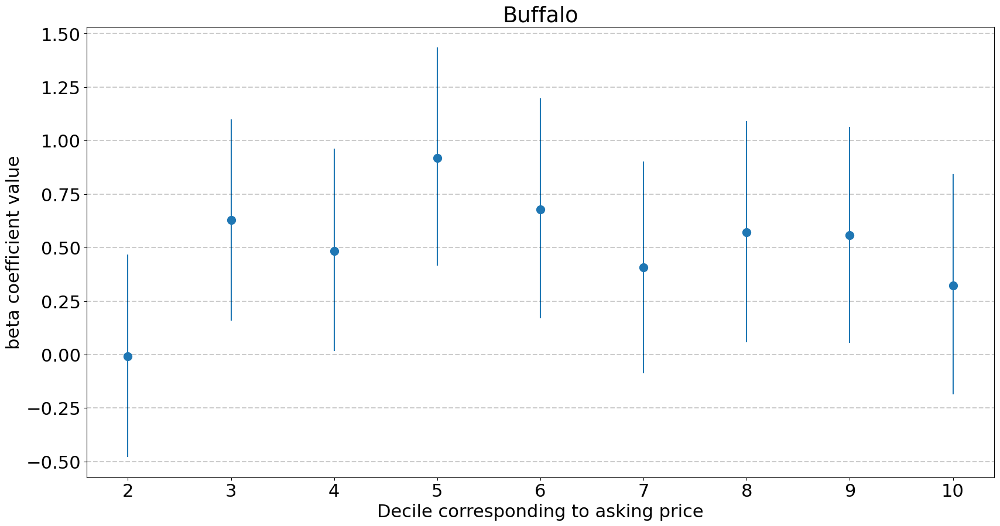

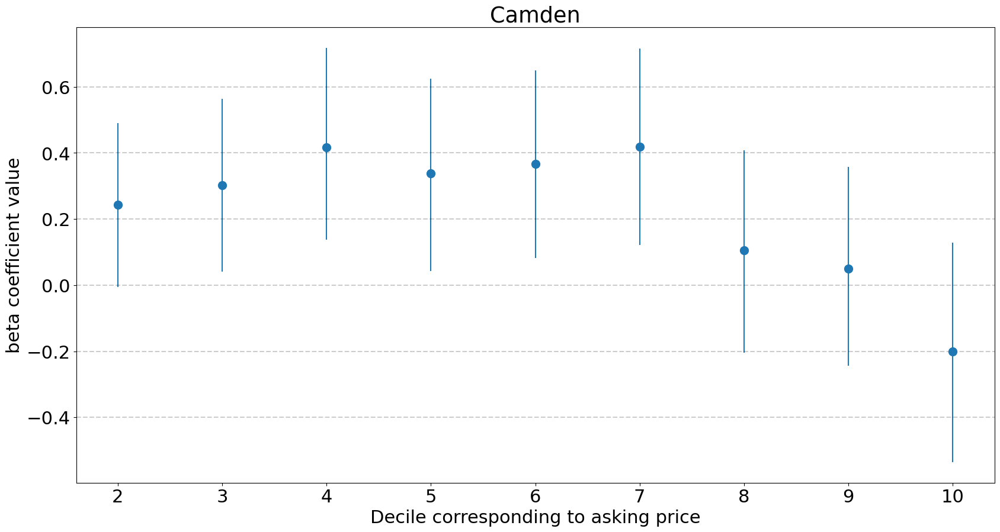

...

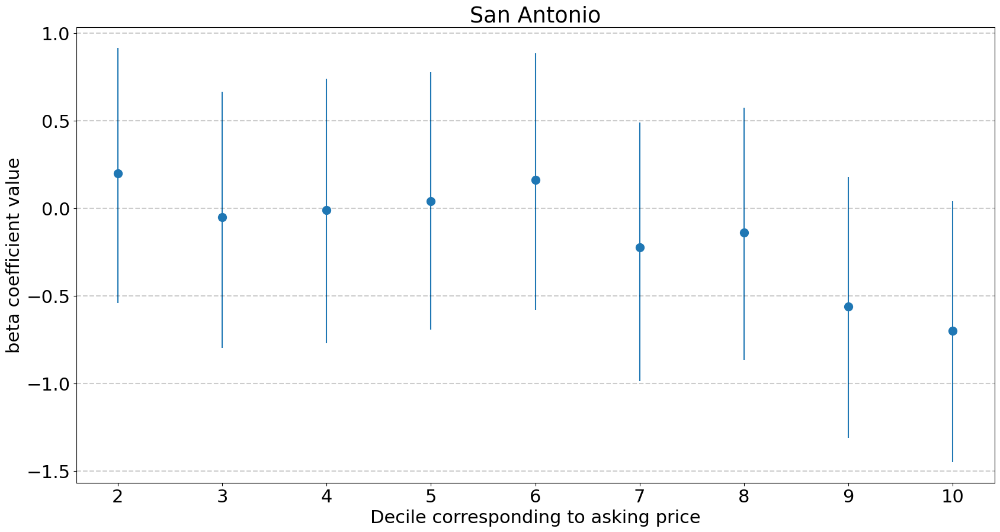

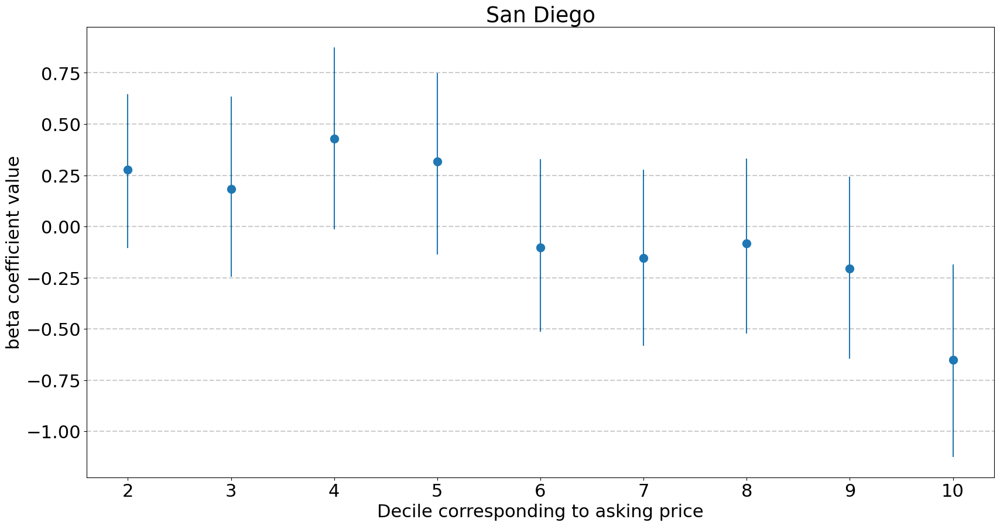

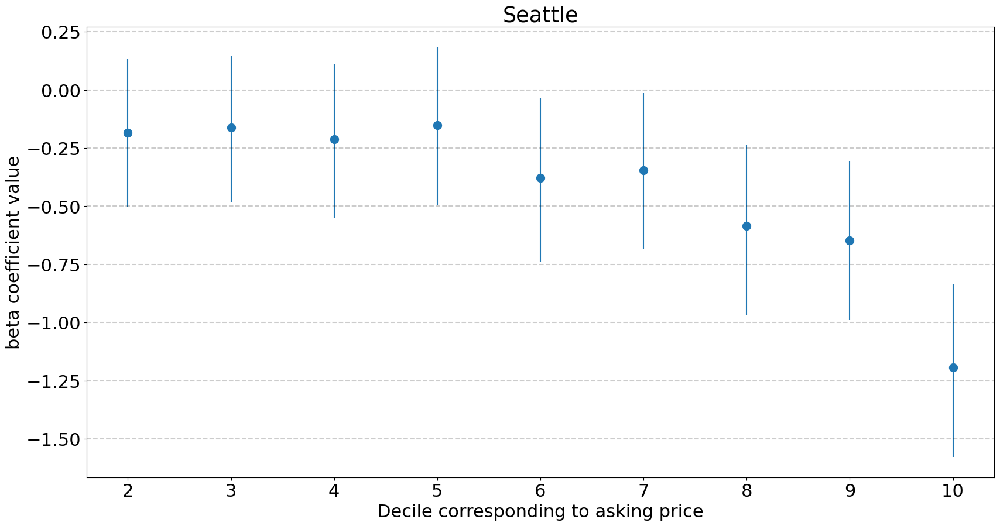

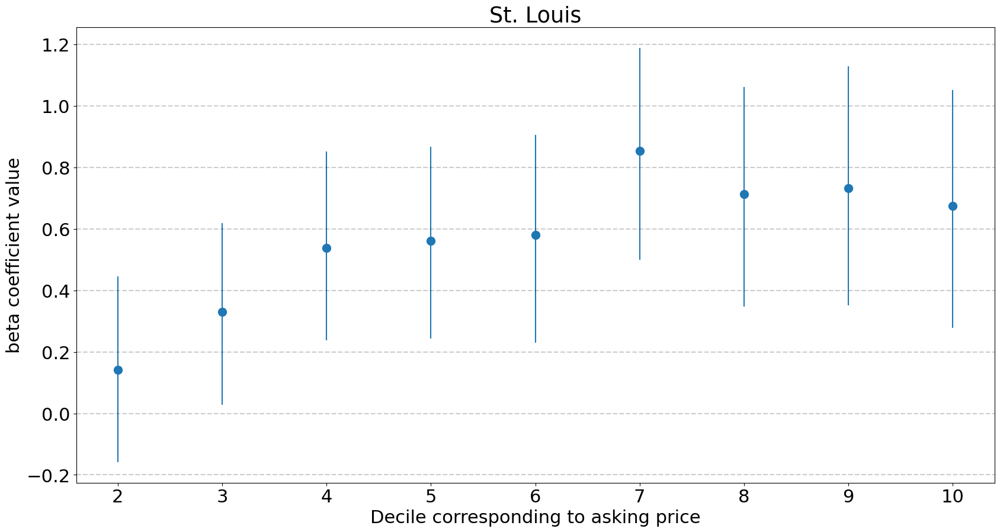

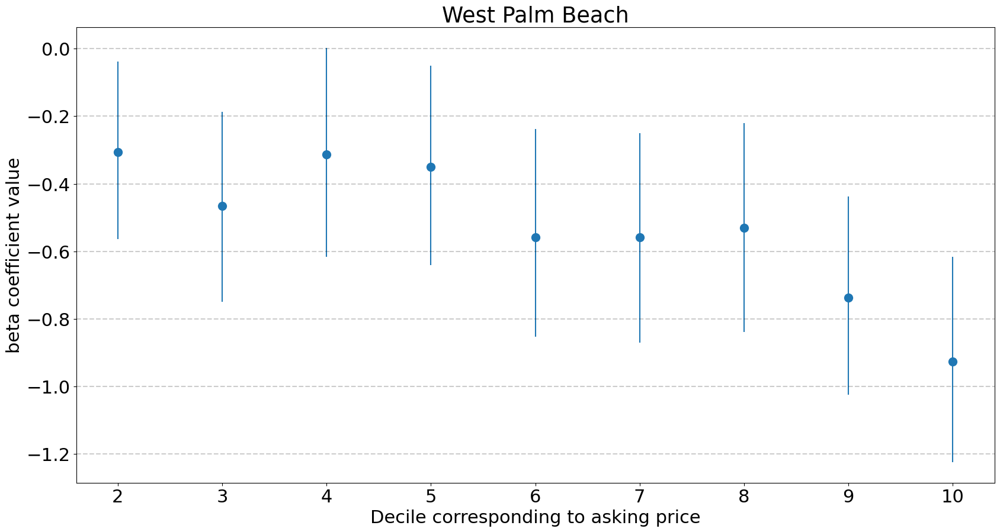

In [55]:
plot_effect_of_variables(
    'b_price', 
    x_label='Decile corresponding to asking price')

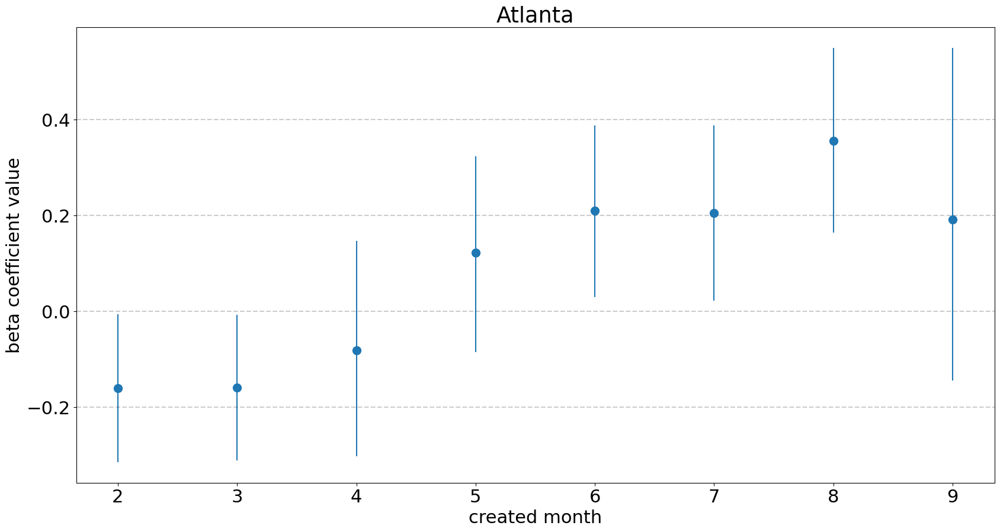

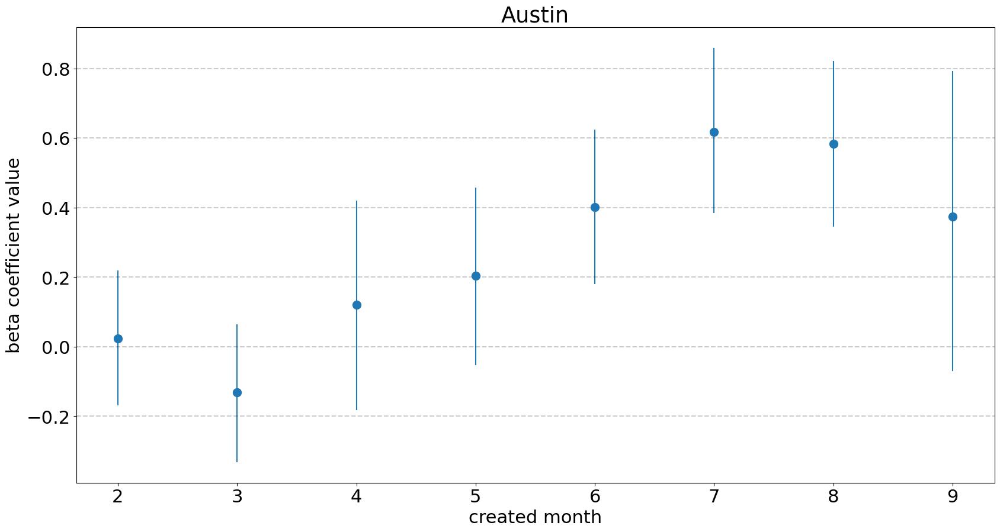

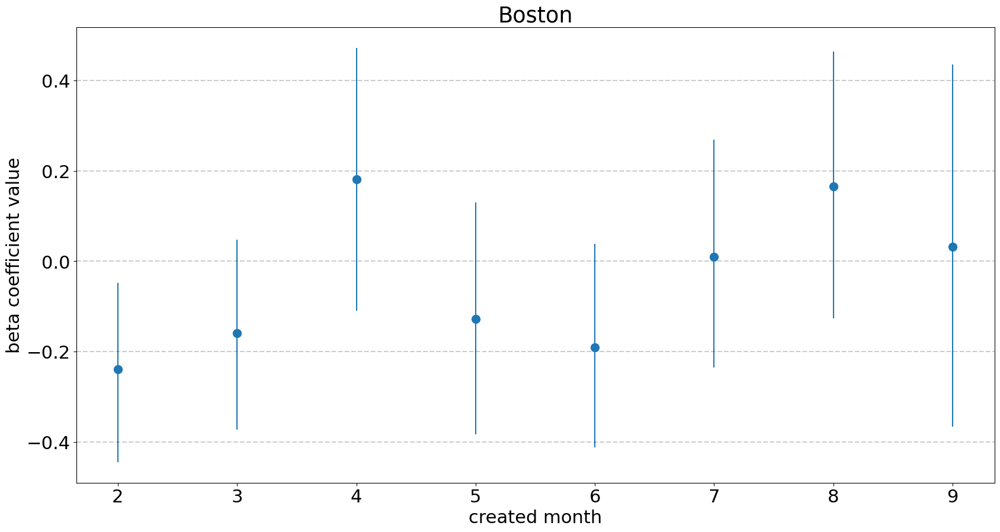

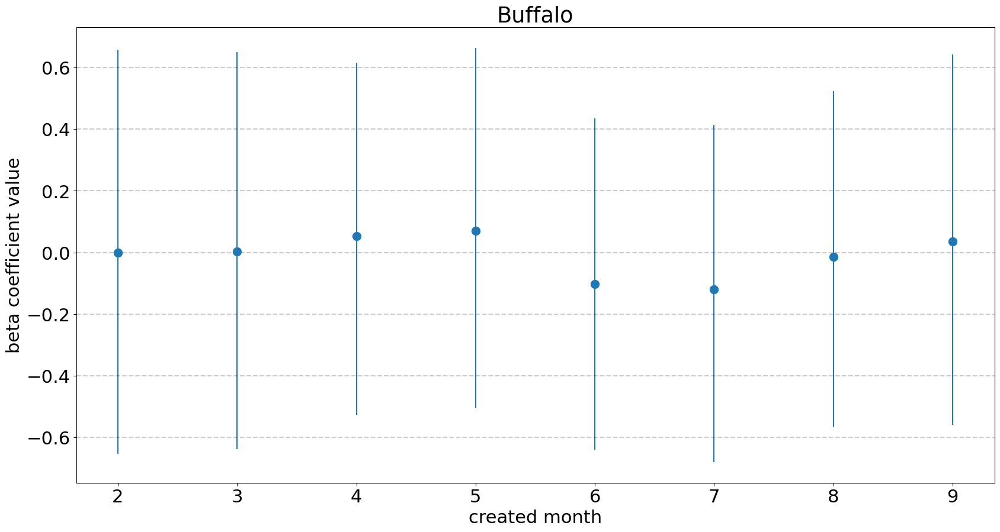

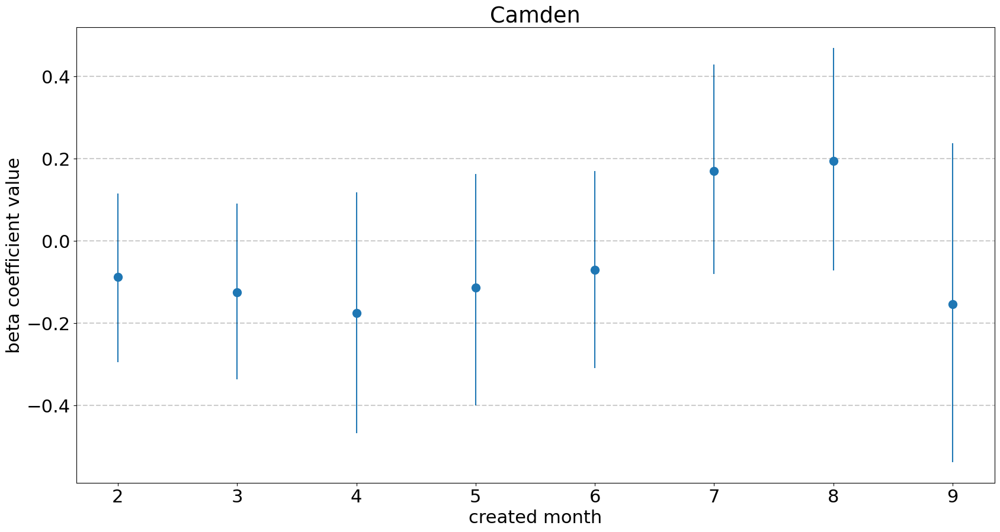

...

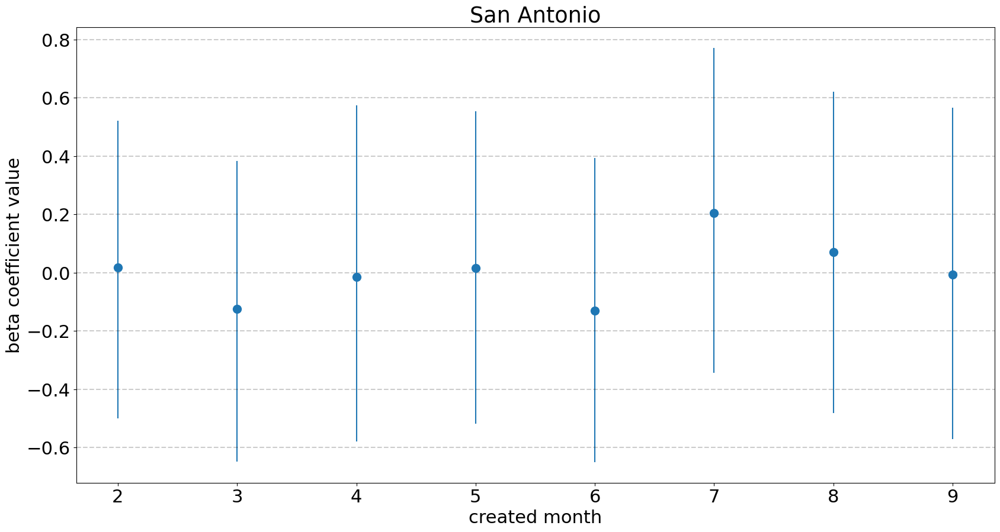

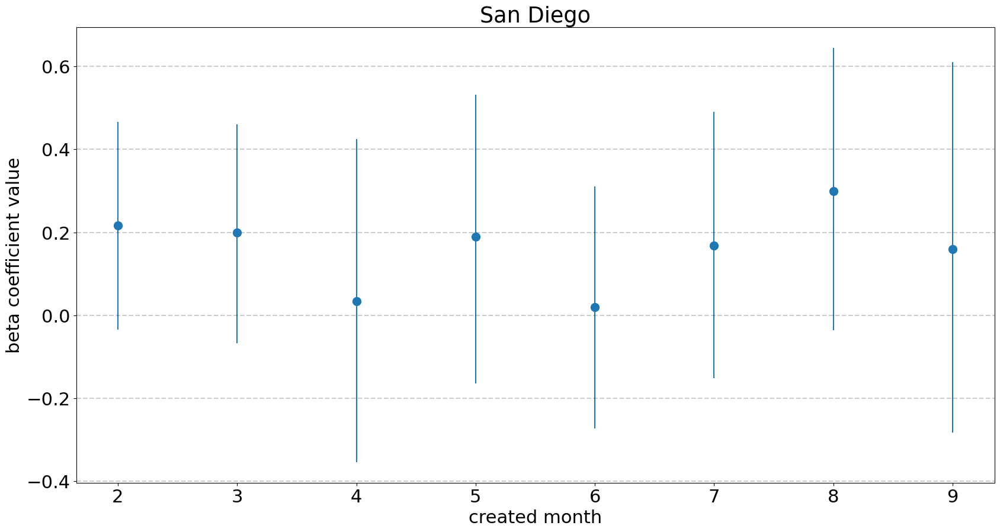

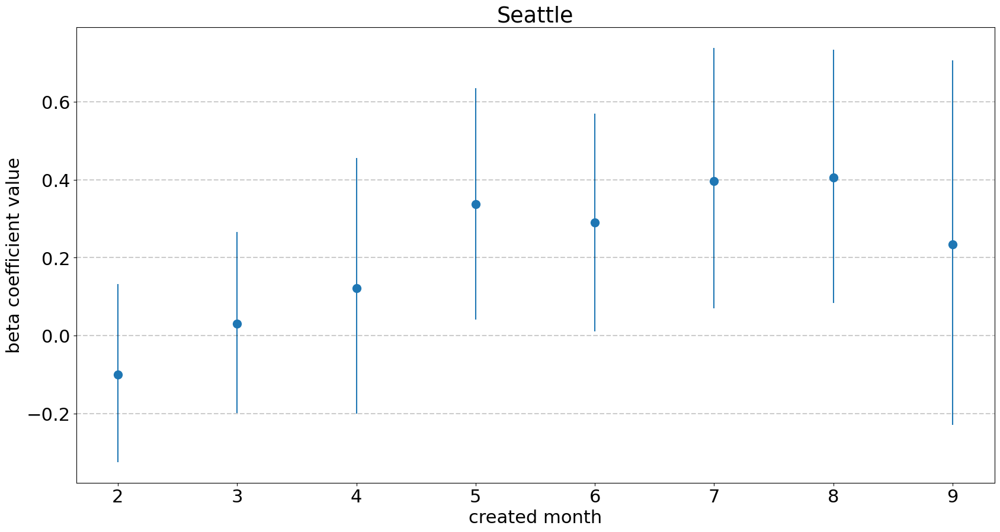

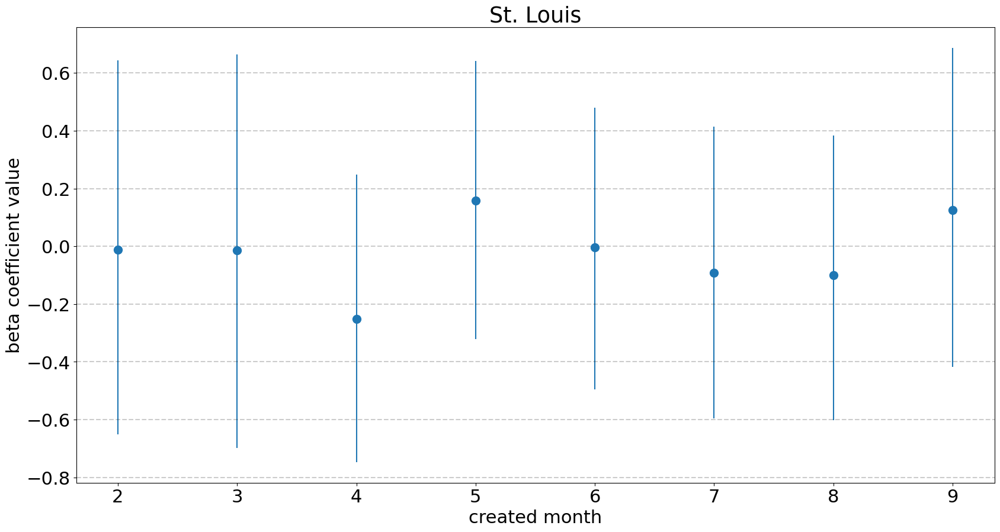

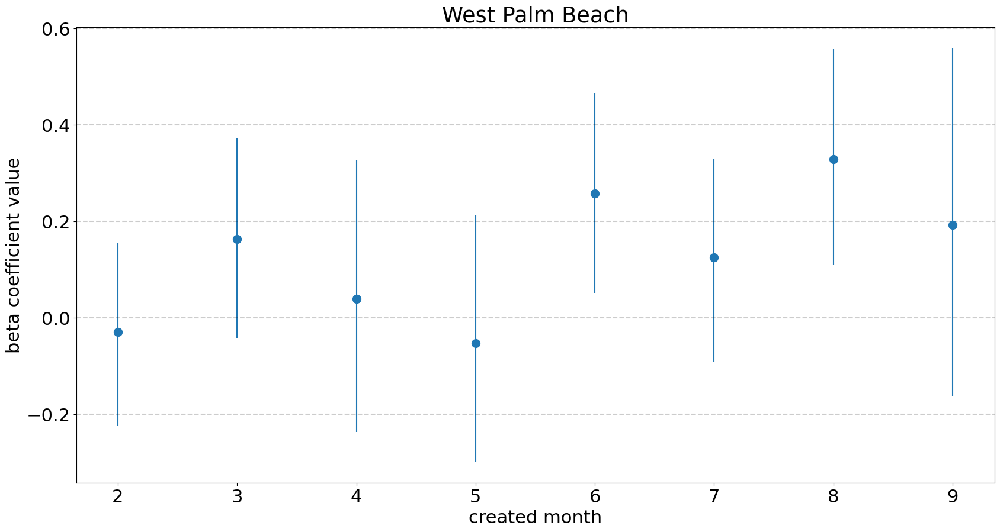

In [56]:
plot_effect_of_variables('b_created_month', 'created month')